In [4]:
# My standard opening cell
%matplotlib notebook
    
from IPython.core.display import display, HTML
display(HTML('<style>.container { width:95% !important; }</style>'))
   
import galsim
import piff
import galsim_extra
import pixmappy

import numpy as np
import pandas as pd
import scipy as sp

from matplotlib import pyplot as plt
from matplotlib import cm,colors,lines
from mpl_toolkits.mplot3d import Axes3D

import astropy
from astropy.io import fits
from astropy.visualization import imshow_norm, MinMaxInterval,LinearStretch,SqrtStretch,ZScaleInterval
from astropy import units as u
from astropy.coordinates import Angle
from astropy.coordinates import SkyCoord
from astropy import coordinates as coord

from astropy.table import Table
import astroquery
from astroquery.simbad import Simbad
from astroquery.vo_conesearch import conf, conesearch, vos_catalog
from astroquery.gaia import Gaia

from esutil import htm

In [2]:
# all custom code is here
from make_FocalPlane_Moments import calculate_moments


In [5]:
print(piff.__file__)
print("Piff Version = ",piff.__version__)
print(galsim.__file__)
print("Galsim Version = ",galsim.__version__)
print(pixmappy.__file__)
print("Pixmappy Version = ",pixmappy.__version__)
print(galsim_extra.__file__)
print("Astropy version = ",astropy.__version__)


/u/ec/roodman/.local/lib/python3.7/site-packages/Piff-0.4-py3.7.egg/piff/__init__.py
Piff Version =  0.4
/nfs/slac/g/ki/ki06/roodman/Software/anaconda3/lib/python3.7/site-packages/GalSim-2.3-py3.7-linux-x86_64.egg/galsim/__init__.py
Galsim Version =  2.3
/u/ec/roodman/.local/lib/python3.7/site-packages/PixMapPy-1.0.0-py3.7.egg/pixmappy/__init__.py
Pixmappy Version =  1.0.0
/u/ec/roodman/.local/lib/python3.7/site-packages/galsim_extra/__init__.py
Astropy version =  4.0.2


# Load Stars using PIFF Input

In [6]:
config_file_name = 'psf_optatmo'
directory = '.'

logger = piff.setup_logger(verbose=2)
config = piff.read_config('{0}/{1}.yaml'.format(directory, config_file_name))
stars, wcs, pointing = piff.Input.process(config['input'], logger=logger)

2021-04-16 16:48:43,953 INFO     Reading in 61 images
2021-04-16 16:48:44,466 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz
2021-04-16 16:48:44,468 INFO     Loading WCS for exposure 228724 ccd 1


2021-04-16 16:49:35,109 INFO     Done loading pixmappy WCS
2021-04-16 16:49:35,525 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_02.fits.fz
2021-04-16 16:49:35,527 INFO     Loading WCS for exposure 228724 ccd 2
2021-04-16 16:49:35,529 INFO     Done loading pixmappy WCS
2021-04-16 16:49:35,937 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_03.fits.fz
2021-04-16 16:49:35,938 INFO     Loading WCS for exposure 228724 ccd 3
2021-04-16 16:49:35,939 INFO     Done loading pixmappy WCS
2021-04-16 16:49:36,340 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_04.fits.fz
2021-04-16 16:49:36,341 INFO     Loading WCS for exposure 228724 ccd 4
2021-04-16 16:49:36,343 INFO     Done loading pixmappy WCS
2021-04-16 16:49:36,779 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbe

2021-04-16 16:49:49,300 INFO     Loading WCS for exposure 228724 ccd 31
2021-04-16 16:49:49,302 INFO     Done loading pixmappy WCS
2021-04-16 16:49:49,714 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_32.fits.fz
2021-04-16 16:49:49,715 INFO     Loading WCS for exposure 228724 ccd 32
2021-04-16 16:49:49,716 INFO     Done loading pixmappy WCS
2021-04-16 16:49:50,148 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_33.fits.fz
2021-04-16 16:49:50,149 INFO     Loading WCS for exposure 228724 ccd 33
2021-04-16 16:49:50,151 INFO     Done loading pixmappy WCS
2021-04-16 16:49:50,564 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_34.fits.fz
2021-04-16 16:49:50,565 INFO     Loading WCS for exposure 228724 ccd 34
2021-04-16 16:49:50,567 INFO     Done loading pixmappy WCS
2021-04-16 16:49:50,981 WARNING  Us

2021-04-16 16:50:02,557 WARNING  Using custom wcs from config for /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_62.fits.fz
2021-04-16 16:50:02,559 INFO     Loading WCS for exposure 228724 ccd 62
2021-04-16 16:50:02,562 INFO     Done loading pixmappy WCS
2021-04-16 16:50:02,564 INFO     Setting pointing from keywords ra, dec in /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz
2021-04-16 16:50:02,597 INFO     Setting pointing to: 22.030 h, -54.404 d
2021-04-16 16:50:02,599 WARNING  Reading image file /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz
2021-04-16 16:50:03,279 INFO     Reading weight image from hdu 3.
2021-04-16 16:50:03,800 INFO     Reading badpix image from hdu 2.
2021-04-16 16:50:04,116 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_01.fits.
2021-04-16 16:50:04,141 INFO     Processing catalog 1 with 296 stars
2021-04-16 16:50:04,148 

2021-04-16 16:50:07,428 INFO     Reading weight image from hdu 3.
2021-04-16 16:50:07,832 INFO     Reading badpix image from hdu 2.
2021-04-16 16:50:08,127 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_03.fits.
2021-04-16 16:50:08,167 INFO     Processing catalog 3 with 377 stars
2021-04-16 16:50:08,221 INFO     Skipping star at position 563.204765,245.201064 with snr=16.069719.
2021-04-16 16:50:08,225 INFO     Skipping star at position 1275.646641,250.978386 with snr=16.367863.
2021-04-16 16:50:08,279 INFO     Skipping star at position 1365.973642,505.023639 with snr=14.274030.
2021-04-16 16:50:08,283 INFO     Skipping star at position 561.469416,529.967220 with snr=9.240399.
2021-04-16 16:50:08,289 INFO     Skipping star at position 1970.900597,605.163905 with snr=14.815268.
2021-04-16 16:50:08,299 INFO     Skipping star at position 1591.732142,647.434937 with snr=11.547733.
2021-04-16 16:50:08,319 INFO     Skipping star at positi

2021-04-16 16:50:10,342 INFO     Skipping star at position 1391.508708,822.089866 with snr=13.852356.
2021-04-16 16:50:10,349 INFO     Skipping star at position 181.101306,830.671271 with snr=6.805551.
2021-04-16 16:50:10,350 INFO     Skipping star at position 930.281368,834.345944 with snr=11.834949.
2021-04-16 16:50:10,360 INFO     Skipping star at position 1532.669419,873.723773 with snr=14.037515.
2021-04-16 16:50:10,366 INFO     Skipping star at position 1404.939745,881.531971 with snr=13.947569.
2021-04-16 16:50:10,374 INFO     Skipping star at position 184.517441,894.755003 with snr=15.195377.
2021-04-16 16:50:10,375 INFO     Skipping star at position 733.773674,901.136982 with snr=17.802405.
2021-04-16 16:50:10,399 INFO     Skipping star at position 948.611914,1021.002950 with snr=7.242085.
2021-04-16 16:50:10,423 INFO     Skipping star at position 129.203789,1084.778466 with snr=10.597633.
2021-04-16 16:50:10,435 INFO     Skipping star at position 1501.280106,1121.476206 with 

2021-04-16 16:50:11,152 INFO     Skipping star at position 249.408357,3113.527977 with snr=6.713514.
2021-04-16 16:50:11,154 INFO     Skipping star at position 920.287607,3119.554780 with snr=19.151032.
2021-04-16 16:50:11,168 INFO     Skipping star at position 189.358915,4044.251191 with snr=14.499372.
2021-04-16 16:50:11,195 WARNING  Reading image file /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_05.fits.fz
2021-04-16 16:50:11,606 INFO     Reading weight image from hdu 3.
2021-04-16 16:50:12,015 INFO     Reading badpix image from hdu 2.
2021-04-16 16:50:12,316 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_05.fits.
2021-04-16 16:50:12,401 INFO     Processing catalog 5 with 376 stars
2021-04-16 16:50:12,411 INFO     Skipping star at position 489.858162,36.583131 with snr=17.606554.
2021-04-16 16:50:12,463 INFO     Skipping star at position 266.433313,194.842279 with snr=18.479541.
2021-04-16 16:50:12,464 IN

2021-04-16 16:50:18,164 INFO     Skipping star at position 1898.202274,1233.100362 with snr=16.451663.
2021-04-16 16:50:18,165 INFO     Skipping star at position 1183.236253,1234.153848 with snr=18.473826.
2021-04-16 16:50:18,172 INFO     Skipping star at position 1401.201217,1260.342151 with snr=14.094294.
2021-04-16 16:50:18,183 INFO     Skipping star at position 489.664814,1305.026493 with snr=6.669045.
2021-04-16 16:50:18,191 INFO     Skipping star at position 780.312249,1363.628797 with snr=11.334750.
2021-04-16 16:50:18,214 INFO     Skipping star at position 245.569218,1433.847514 with snr=9.566693.
2021-04-16 16:50:18,259 INFO     Skipping star at position 886.090434,1577.544761 with snr=11.061778.
2021-04-16 16:50:18,265 INFO     Skipping star at position 406.068210,1596.787146 with snr=19.807983.
2021-04-16 16:50:18,267 INFO     Skipping star at position 321.066703,1613.137578 with snr=12.696063.
2021-04-16 16:50:18,271 INFO     Skipping star at position 1051.518328,1631.01727

2021-04-16 16:50:21,898 INFO     Reading badpix image from hdu 2.
2021-04-16 16:50:22,213 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_10.fits.
2021-04-16 16:50:22,233 INFO     Processing catalog 10 with 426 stars
2021-04-16 16:50:22,241 INFO     Skipping star at position 510.400968,67.955831 with snr=8.243412.
2021-04-16 16:50:22,281 INFO     Skipping star at position 211.799502,254.057749 with snr=8.357107.
2021-04-16 16:50:22,285 INFO     Skipping star at position 769.106207,264.322706 with snr=7.099800.
2021-04-16 16:50:22,289 INFO     Skipping star at position 109.056374,283.739436 with snr=10.344987.
2021-04-16 16:50:22,293 INFO     Skipping star at position 846.381670,295.670970 with snr=7.288402.
2021-04-16 16:50:22,301 INFO     Skipping star at position 1707.534048,306.394658 with snr=14.152038.
2021-04-16 16:50:22,308 INFO     Skipping star at position 1029.763632,365.715298 with snr=9.975554.
2021-04-16 16:50:22,322 INF

2021-04-16 16:50:24,760 INFO     Skipping star at position 765.814374,948.356243 with snr=19.784975.
2021-04-16 16:50:25,021 INFO     Skipping star at position 60.456933,1757.100271 with snr=19.200656.
2021-04-16 16:50:25,029 INFO     Skipping star at position 1026.232249,1785.958769 with snr=17.711268.
2021-04-16 16:50:25,214 INFO     Skipping star at position 1762.628553,2297.035949 with snr=17.215957.
2021-04-16 16:50:25,215 INFO     Skipping star at position 183.590553,2315.492044 with snr=14.375084.
2021-04-16 16:50:25,278 INFO     Skipping star at position 193.474973,2512.783463 with snr=14.201442.
2021-04-16 16:50:25,302 INFO     Skipping star at position 1818.397323,2562.571974 with snr=15.919807.
2021-04-16 16:50:25,303 INFO     Skipping star at position 1411.720738,2564.784442 with snr=17.933321.
2021-04-16 16:50:25,313 INFO     Skipping star at position 1083.756615,2573.762502 with snr=17.381723.
2021-04-16 16:50:25,372 INFO     Skipping star at position 1798.758259,2704.439

2021-04-16 16:50:31,404 INFO     Skipping star at position 647.351126,596.871201 with snr=19.941948.
2021-04-16 16:50:31,439 INFO     Skipping star at position 2009.332619,755.136808 with snr=5.809786.
2021-04-16 16:50:31,443 INFO     Skipping star at position 746.262340,782.382759 with snr=8.369373.
2021-04-16 16:50:31,452 INFO     Skipping star at position 1939.111960,798.979654 with snr=15.099082.
2021-04-16 16:50:31,461 INFO     Skipping star at position 1213.728597,829.593338 with snr=13.679863.
2021-04-16 16:50:31,476 INFO     Skipping star at position 1136.643296,938.871062 with snr=8.523298.
2021-04-16 16:50:31,482 INFO     Skipping star at position 1317.980909,969.700614 with snr=9.672487.
2021-04-16 16:50:31,484 INFO     Skipping star at position 336.484948,978.782727 with snr=14.126265.
2021-04-16 16:50:31,493 INFO     Skipping star at position 1215.541260,1024.860962 with snr=15.574553.
2021-04-16 16:50:31,517 INFO     Skipping star at position 1492.028279,1126.312925 with 

2021-04-16 16:50:33,739 INFO     Skipping star at position 563.506248,1249.079952 with snr=6.892240.
2021-04-16 16:50:33,754 INFO     Skipping star at position 1707.515189,1326.884656 with snr=16.335630.
2021-04-16 16:50:33,758 INFO     Skipping star at position 1887.942165,1334.047927 with snr=0.000000.
2021-04-16 16:50:33,784 INFO     Skipping star at position 265.658059,1454.125990 with snr=8.697740.
2021-04-16 16:50:33,791 INFO     Skipping star at position 1115.024493,1493.496071 with snr=17.900886.
2021-04-16 16:50:33,795 INFO     Skipping star at position 1197.258436,1512.740173 with snr=11.843226.
2021-04-16 16:50:33,804 INFO     Skipping star at position 699.925900,1572.186062 with snr=5.199748.
2021-04-16 16:50:33,820 INFO     Skipping star at position 54.974242,1669.280252 with snr=11.659193.
2021-04-16 16:50:33,821 INFO     Skipping star at position 145.655460,1672.212466 with snr=7.078754.
2021-04-16 16:50:33,825 INFO     Skipping star at position 75.818719,1678.096536 wit

2021-04-16 16:50:39,880 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_18.fits.
2021-04-16 16:50:39,917 INFO     Processing catalog 18 with 377 stars
2021-04-16 16:50:39,934 INFO     Skipping star at position 175.332511,88.558628 with snr=19.276954.
2021-04-16 16:50:39,961 INFO     Skipping star at position 1595.791664,248.014844 with snr=10.010365.
2021-04-16 16:50:39,986 INFO     Skipping star at position 1224.471890,363.267931 with snr=14.019756.
2021-04-16 16:50:40,014 INFO     Skipping star at position 1869.792101,441.678874 with snr=14.194173.
2021-04-16 16:50:40,034 INFO     Skipping star at position 577.894582,519.161459 with snr=15.416760.
2021-04-16 16:50:40,057 INFO     Skipping star at position 1322.326056,601.832783 with snr=17.725122.
2021-04-16 16:50:40,076 INFO     Skipping star at position 955.871721,648.362590 with snr=16.424772.
2021-04-16 16:50:40,090 INFO     Skipping star at position 729.272629,711.169139 with 

2021-04-16 16:50:43,137 INFO     Skipping star at position 1786.921665,1985.065025 with snr=17.336934.
2021-04-16 16:50:43,191 INFO     Skipping star at position 1969.582562,2083.960782 with snr=9.782743.
2021-04-16 16:50:43,200 INFO     Skipping star at position 291.229261,2103.545009 with snr=16.409769.
2021-04-16 16:50:43,281 INFO     Skipping star at position 1062.686421,2313.417259 with snr=13.453146.
2021-04-16 16:50:43,326 INFO     Skipping star at position 277.911650,2517.656750 with snr=17.167450.
2021-04-16 16:50:43,356 INFO     Skipping star at position 453.396850,2587.461458 with snr=17.396967.
2021-04-16 16:50:43,365 INFO     Skipping star at position 867.249924,2613.339253 with snr=17.183612.
2021-04-16 16:50:43,367 INFO     Skipping star at position 929.293501,2622.827057 with snr=16.882967.
2021-04-16 16:50:43,383 INFO     Skipping star at position 870.825271,2668.853673 with snr=13.469503.
2021-04-16 16:50:43,395 INFO     Skipping star at position 1905.720018,2680.5295

2021-04-16 16:50:45,946 INFO     Skipping star at position 1262.958432,3522.020130 with snr=8.090350.
2021-04-16 16:50:45,973 INFO     Skipping star at position 1926.949114,3527.609707 with snr=17.509263.
2021-04-16 16:50:46,020 INFO     Skipping star at position 255.892624,3421.578417 with snr=14.606130.
2021-04-16 16:50:46,034 INFO     Skipping star at position 1935.437026,3412.557464 with snr=19.641732.
2021-04-16 16:50:46,066 INFO     Skipping star at position 1101.614065,3174.428062 with snr=8.925067.
2021-04-16 16:50:46,089 INFO     Skipping star at position 728.498826,3253.236042 with snr=14.397126.
2021-04-16 16:50:46,101 INFO     Skipping star at position 1795.089599,3217.113117 with snr=17.742309.
2021-04-16 16:50:46,163 INFO     Skipping star at position 103.486330,3191.584965 with snr=12.466975.
2021-04-16 16:50:46,182 INFO     Skipping star at position 1636.994953,4050.015492 with snr=18.755272.
2021-04-16 16:50:46,219 INFO     Skipping star at position 1122.050582,3496.32

2021-04-16 16:50:50,348 INFO     Skipping star at position 1406.915866,2645.703706 with snr=16.661176.
2021-04-16 16:50:50,358 INFO     Skipping star at position 1176.381452,2658.915371 with snr=10.249376.
2021-04-16 16:50:50,375 INFO     Skipping star at position 51.536110,2731.866494 with snr=11.429789.
2021-04-16 16:50:50,406 INFO     Skipping star at position 482.406442,2841.824906 with snr=10.301645.
2021-04-16 16:50:50,463 INFO     Skipping star at position 359.498489,3901.375140 with snr=12.530544.
2021-04-16 16:50:50,470 INFO     Skipping star at position 758.368542,3895.363719 with snr=6.894902.
2021-04-16 16:50:50,552 INFO     Skipping star at position 75.731619,3610.854721 with snr=14.935061.
2021-04-16 16:50:50,556 INFO     Skipping star at position 865.084941,3144.985787 with snr=17.156392.
2021-04-16 16:50:50,579 INFO     Skipping star at position 757.997121,3557.518226 with snr=11.952986.
2021-04-16 16:50:50,602 INFO     Skipping star at position 1676.610194,3498.773937 

2021-04-16 16:50:54,517 INFO     Skipping star at position 122.794246,1055.672049 with snr=18.571254.
2021-04-16 16:50:54,524 INFO     Skipping star at position 1809.066947,1068.016277 with snr=19.363116.
2021-04-16 16:50:54,599 INFO     Skipping star at position 1383.024982,1229.941515 with snr=14.380643.
2021-04-16 16:50:54,624 INFO     Skipping star at position 760.543736,1285.857541 with snr=16.760972.
2021-04-16 16:50:54,625 INFO     Skipping star at position 262.035123,1328.502030 with snr=14.476918.
2021-04-16 16:50:54,656 INFO     Skipping star at position 297.715541,1371.860466 with snr=18.867820.
2021-04-16 16:50:54,686 INFO     Skipping star at position 425.095351,1441.039609 with snr=15.837209.
2021-04-16 16:50:54,754 INFO     Skipping star at position 1064.470108,1626.600585 with snr=14.048108.
2021-04-16 16:50:54,856 INFO     Skipping star at position 464.141317,1795.509664 with snr=16.160099.
2021-04-16 16:50:54,902 INFO     Skipping star at position 1834.819783,1905.687

2021-04-16 16:51:00,382 INFO     Skipping star at position 1088.188346,1761.200710 with snr=13.104349.
2021-04-16 16:51:00,414 INFO     Skipping star at position 307.195590,1911.269093 with snr=13.123512.
2021-04-16 16:51:00,424 INFO     Skipping star at position 1675.050269,1949.663526 with snr=13.794334.
2021-04-16 16:51:00,425 INFO     Skipping star at position 1656.285155,1951.743903 with snr=15.804206.
2021-04-16 16:51:00,474 INFO     Skipping star at position 452.960826,2258.030007 with snr=17.768607.
2021-04-16 16:51:00,531 INFO     Skipping star at position 1596.061380,2544.239006 with snr=16.467341.
2021-04-16 16:51:00,549 INFO     Skipping star at position 1226.205210,2616.363012 with snr=19.196313.
2021-04-16 16:51:00,577 INFO     Skipping star at position 1058.673092,2703.323513 with snr=12.247847.
2021-04-16 16:51:00,584 INFO     Skipping star at position 1901.029813,2728.131164 with snr=17.081478.
2021-04-16 16:51:00,594 INFO     Skipping star at position 793.566971,2742.

2021-04-16 16:51:04,686 INFO     Skipping star at position 905.419655,2909.225025 with snr=17.917879.
2021-04-16 16:51:04,696 INFO     Skipping star at position 666.443039,2933.976367 with snr=12.052285.
2021-04-16 16:51:04,697 INFO     Skipping star at position 528.064073,2934.722348 with snr=15.985369.
2021-04-16 16:51:04,717 INFO     Skipping star at position 228.529872,3017.310842 with snr=18.867377.
2021-04-16 16:51:04,762 INFO     Skipping star at position 295.242402,3811.722012 with snr=15.112346.
2021-04-16 16:51:04,801 INFO     Skipping star at position 1370.441521,3514.617701 with snr=10.668986.
2021-04-16 16:51:04,811 INFO     Skipping star at position 584.874413,3843.248277 with snr=17.210937.
2021-04-16 16:51:04,812 INFO     Skipping star at position 903.353152,3390.629528 with snr=16.790236.
2021-04-16 16:51:04,831 INFO     Skipping star at position 277.584316,3346.955809 with snr=19.242903.
2021-04-16 16:51:04,846 INFO     Skipping star at position 1504.573051,3319.86860

2021-04-16 16:51:11,039 INFO     Skipping star at position 503.013031,306.085158 with snr=9.075918.
2021-04-16 16:51:11,043 INFO     Skipping star at position 285.199757,365.694277 with snr=5.278129.
2021-04-16 16:51:11,053 INFO     Skipping star at position 576.004792,476.020424 with snr=18.668362.
2021-04-16 16:51:11,055 INFO     Skipping star at position 378.489928,523.650245 with snr=10.255908.
2021-04-16 16:51:11,056 INFO     Skipping star at position 431.164419,534.041740 with snr=7.595334.
2021-04-16 16:51:11,058 INFO     Skipping star at position 887.982014,546.269548 with snr=2.535302.
2021-04-16 16:51:11,062 INFO     Skipping star at position 136.604220,576.669574 with snr=9.211585.
2021-04-16 16:51:11,070 INFO     Skipping star at position 635.088275,689.972885 with snr=0.000000.
2021-04-16 16:51:11,074 INFO     Skipping star at position 660.060429,711.157750 with snr=1.257641.
2021-04-16 16:51:11,081 INFO     Skipping star at position 899.479330,815.291349 with snr=12.57850

2021-04-16 16:51:16,018 INFO     Skipping star at position 634.208249,3178.163365 with snr=10.550521.
2021-04-16 16:51:16,022 INFO     Skipping star at position 1122.571112,3808.988749 with snr=12.080396.
2021-04-16 16:51:16,030 INFO     Skipping star at position 705.059199,3564.279196 with snr=17.402855.
2021-04-16 16:51:16,075 INFO     Skipping star at position 1398.357129,3685.856877 with snr=15.259692.
2021-04-16 16:51:16,116 INFO     Skipping star at position 715.057140,3491.492657 with snr=14.395988.
2021-04-16 16:51:16,126 INFO     Skipping star at position 767.866174,3320.435643 with snr=14.283811.
2021-04-16 16:51:16,188 INFO     Skipping star at position 1808.387905,3222.594298 with snr=10.850432.
2021-04-16 16:51:16,193 INFO     Skipping star at position 590.579403,3254.891434 with snr=17.932021.
2021-04-16 16:51:16,242 WARNING  Reading image file /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_34.fits.fz
2021-04-16 16:51:16,728 INFO     Reading weight 

2021-04-16 16:51:24,271 INFO     Skipping star at position 1945.946452,1681.802734 with snr=18.050381.
2021-04-16 16:51:24,314 INFO     Skipping star at position 588.587316,1875.681877 with snr=18.901050.
2021-04-16 16:51:24,330 INFO     Skipping star at position 280.435151,1899.529470 with snr=16.695868.
2021-04-16 16:51:24,357 INFO     Skipping star at position 1337.813818,1993.597203 with snr=15.121208.
2021-04-16 16:51:24,380 INFO     Skipping star at position 76.357179,2267.561191 with snr=16.738204.
2021-04-16 16:51:24,386 INFO     Skipping star at position 1086.115231,2301.207290 with snr=15.277443.
2021-04-16 16:51:24,413 INFO     Skipping star at position 846.217463,2416.054284 with snr=13.041051.
2021-04-16 16:51:24,414 INFO     Skipping star at position 1774.306741,2416.914994 with snr=19.337989.
2021-04-16 16:51:24,426 INFO     Skipping star at position 77.193808,2520.060481 with snr=13.549371.
2021-04-16 16:51:24,450 INFO     Skipping star at position 1964.582386,2658.4503

2021-04-16 16:51:28,812 INFO     Skipping star at position 1344.235355,1766.557174 with snr=15.442372.
2021-04-16 16:51:28,838 INFO     Skipping star at position 529.197450,1924.009714 with snr=14.113285.
2021-04-16 16:51:28,842 INFO     Skipping star at position 1304.823721,1940.130166 with snr=18.370503.
2021-04-16 16:51:28,858 INFO     Skipping star at position 1520.431726,1986.549208 with snr=16.548281.
2021-04-16 16:51:28,865 INFO     Skipping star at position 526.215124,2018.462970 with snr=13.230449.
2021-04-16 16:51:28,914 INFO     Skipping star at position 759.076466,2419.107152 with snr=18.714153.
2021-04-16 16:51:28,974 INFO     Skipping star at position 181.588283,2673.700893 with snr=15.350816.
2021-04-16 16:51:28,992 INFO     Skipping star at position 1772.949503,2741.435157 with snr=19.208336.
2021-04-16 16:51:29,053 INFO     Skipping star at position 1367.598566,2908.413997 with snr=14.428798.
2021-04-16 16:51:29,057 INFO     Skipping star at position 527.495579,2963.49

2021-04-16 16:51:31,684 INFO     Skipping star at position 1046.507023,3940.390194 with snr=13.681083.
2021-04-16 16:51:31,702 INFO     Skipping star at position 780.243730,3350.268378 with snr=18.831772.
2021-04-16 16:51:31,706 INFO     Skipping star at position 1430.626170,3882.591932 with snr=17.756157.
2021-04-16 16:51:31,716 WARNING  Reading image file /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_41.fits.fz
2021-04-16 16:51:32,221 INFO     Reading weight image from hdu 3.
2021-04-16 16:51:32,722 INFO     Reading badpix image from hdu 2.
2021-04-16 16:51:33,115 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_41.fits.
2021-04-16 16:51:33,149 INFO     Processing catalog 41 with 509 stars
2021-04-16 16:51:33,157 INFO     Skipping star at position 1146.983368,42.872671 with snr=11.616501.
2021-04-16 16:51:33,199 INFO     Skipping star at position 680.266391,255.058909 with snr=3.610950.
2021-04-16 16:51:33,20

2021-04-16 16:51:33,934 INFO     Skipping star at position 1801.245418,2570.269946 with snr=17.941311.
2021-04-16 16:51:33,964 INFO     Skipping star at position 891.588919,2687.900696 with snr=4.782670.
2021-04-16 16:51:33,971 INFO     Skipping star at position 1329.012181,2723.003997 with snr=16.372424.
2021-04-16 16:51:33,975 INFO     Skipping star at position 1357.532752,2753.845164 with snr=6.963900.
2021-04-16 16:51:33,994 INFO     Skipping star at position 714.325132,2802.278853 with snr=12.583087.
2021-04-16 16:51:33,998 INFO     Skipping star at position 1136.690705,2829.440958 with snr=16.989905.
2021-04-16 16:51:34,005 INFO     Skipping star at position 655.801687,2845.989580 with snr=18.385444.
2021-04-16 16:51:34,013 INFO     Skipping star at position 1536.846397,2866.342501 with snr=9.539158.
2021-04-16 16:51:34,025 INFO     Skipping star at position 496.711557,2873.891101 with snr=12.521904.
2021-04-16 16:51:34,036 INFO     Skipping star at position 1450.120156,2909.0951

2021-04-16 16:51:43,191 INFO     Skipping star at position 948.419463,1315.258250 with snr=17.536252.
2021-04-16 16:51:43,222 INFO     Skipping star at position 196.058124,1510.104966 with snr=13.332410.
2021-04-16 16:51:43,338 INFO     Skipping star at position 903.187162,1907.069080 with snr=13.097285.
2021-04-16 16:51:43,391 INFO     Skipping star at position 493.709806,2039.029521 with snr=17.324562.
2021-04-16 16:51:43,403 INFO     Skipping star at position 1720.423063,2053.490510 with snr=17.283181.
2021-04-16 16:51:43,488 INFO     Skipping star at position 789.109942,2278.629117 with snr=14.697013.
2021-04-16 16:51:43,804 INFO     Skipping star at position 490.525247,2983.117563 with snr=17.112735.
2021-04-16 16:51:43,886 INFO     Skipping star at position 893.755135,3134.952698 with snr=11.681506.
2021-04-16 16:51:43,953 INFO     Skipping star at position 1116.487232,3676.035976 with snr=16.668578.
2021-04-16 16:51:44,039 INFO     Skipping star at position 1485.077330,3380.6868

2021-04-16 16:51:53,713 INFO     Skipping star at position 458.977382,2379.318235 with snr=17.185079.
2021-04-16 16:51:53,757 INFO     Skipping star at position 1993.695667,2534.436559 with snr=14.054883.
2021-04-16 16:51:53,805 INFO     Skipping star at position 330.098161,2726.216824 with snr=12.630498.
2021-04-16 16:51:53,833 INFO     Skipping star at position 1519.165018,2794.880470 with snr=12.912413.
2021-04-16 16:51:53,869 INFO     Skipping star at position 1627.748842,2927.676304 with snr=14.023548.
2021-04-16 16:51:53,888 INFO     Skipping star at position 259.084607,2992.574638 with snr=19.951712.
2021-04-16 16:51:53,907 INFO     Skipping star at position 1580.168311,4039.312894 with snr=19.916298.
2021-04-16 16:51:53,932 INFO     Skipping star at position 1556.908325,3293.796679 with snr=15.619274.
2021-04-16 16:51:53,990 INFO     Skipping star at position 509.076439,3349.401359 with snr=16.326647.
2021-04-16 16:51:53,997 INFO     Skipping star at position 133.151682,3455.29

2021-04-16 16:52:02,796 INFO     Skipping star at position 471.218950,1284.026086 with snr=19.515382.
2021-04-16 16:52:02,828 INFO     Skipping star at position 572.020925,1372.147820 with snr=17.298668.
2021-04-16 16:52:02,842 INFO     Skipping star at position 705.986957,1382.339029 with snr=13.758658.
2021-04-16 16:52:02,893 INFO     Skipping star at position 1106.712595,1504.766544 with snr=17.298855.
2021-04-16 16:52:02,896 INFO     Skipping star at position 1682.602541,1526.836105 with snr=9.744302.
2021-04-16 16:52:02,919 INFO     Skipping star at position 469.572853,1539.882012 with snr=8.511975.
2021-04-16 16:52:02,962 INFO     Skipping star at position 1554.530326,1631.952187 with snr=13.190061.
2021-04-16 16:52:02,980 INFO     Skipping star at position 979.983623,1662.224435 with snr=17.614087.
2021-04-16 16:52:03,008 INFO     Skipping star at position 306.781868,1767.822041 with snr=11.960577.
2021-04-16 16:52:03,036 INFO     Skipping star at position 716.583707,1837.601328

2021-04-16 16:52:06,025 INFO     Skipping star at position 1460.162410,1070.375511 with snr=8.324743.
2021-04-16 16:52:06,027 INFO     Skipping star at position 1973.741412,1081.337637 with snr=6.383980.
2021-04-16 16:52:06,028 INFO     Skipping star at position 1224.029588,1083.126522 with snr=19.472122.
2021-04-16 16:52:06,036 INFO     Skipping star at position 93.597785,1118.508979 with snr=15.307381.
2021-04-16 16:52:06,046 INFO     Skipping star at position 1214.329575,1145.384174 with snr=3.386611.
2021-04-16 16:52:06,074 INFO     Skipping star at position 502.316592,1218.603364 with snr=14.053112.
2021-04-16 16:52:06,084 INFO     Skipping star at position 1451.144374,1243.735590 with snr=7.874197.
2021-04-16 16:52:06,109 INFO     Skipping star at position 1201.684562,1322.563332 with snr=16.973391.
2021-04-16 16:52:06,116 INFO     Skipping star at position 140.519558,1347.467704 with snr=8.422896.
2021-04-16 16:52:06,138 INFO     Skipping star at position 1454.466605,1395.697201

2021-04-16 16:52:06,781 INFO     Skipping star at position 351.229963,3844.197648 with snr=16.971311.
2021-04-16 16:52:06,794 INFO     Skipping star at position 1989.886369,3863.484003 with snr=5.917635.
2021-04-16 16:52:06,813 INFO     Skipping star at position 260.822337,3941.636210 with snr=17.865995.
2021-04-16 16:52:06,817 INFO     Skipping star at position 1769.335844,3977.010598 with snr=12.787405.
2021-04-16 16:52:06,831 INFO     Skipping star at position 664.397199,3920.050907 with snr=12.943058.
2021-04-16 16:52:06,839 WARNING  Reading image file /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_55.fits.fz
2021-04-16 16:52:07,379 INFO     Reading weight image from hdu 3.
2021-04-16 16:52:07,918 INFO     Reading badpix image from hdu 2.
2021-04-16 16:52:08,350 WARNING  Reading star catalog /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_cat_228724_55.fits.
2021-04-16 16:52:08,380 INFO     Processing catalog 55 with 260 stars
2021-04-16 16:52:08,

2021-04-16 16:52:15,837 INFO     Skipping star at position 1091.311419,2377.271174 with snr=7.422378.
2021-04-16 16:52:15,859 INFO     Skipping star at position 1774.494629,2424.568710 with snr=14.839379.
2021-04-16 16:52:15,925 INFO     Skipping star at position 1763.340932,2686.275013 with snr=13.043223.
2021-04-16 16:52:15,929 INFO     Skipping star at position 1806.289706,2728.341417 with snr=18.052555.
2021-04-16 16:52:15,934 INFO     Skipping star at position 1189.683267,2737.576956 with snr=5.956298.
2021-04-16 16:52:15,962 INFO     Skipping star at position 301.602743,2906.159373 with snr=11.069294.
2021-04-16 16:52:15,978 INFO     Skipping star at position 1304.940649,2968.951624 with snr=15.786684.
2021-04-16 16:52:15,982 INFO     Skipping star at position 75.186657,2988.544105 with snr=13.310610.
2021-04-16 16:52:15,983 INFO     Skipping star at position 542.736188,2991.423993 with snr=11.360437.
2021-04-16 16:52:16,001 INFO     Skipping star at position 1960.125839,3075.935

2021-04-16 16:52:22,433 INFO     Skipping star at position 1035.410234,2306.145138 with snr=12.841336.
2021-04-16 16:52:22,445 INFO     Skipping star at position 1665.237395,2348.398186 with snr=19.673434.
2021-04-16 16:52:22,478 INFO     Skipping star at position 1711.090701,2508.801365 with snr=16.766425.
2021-04-16 16:52:22,484 INFO     Skipping star at position 272.482802,2573.633170 with snr=18.103380.
2021-04-16 16:52:22,492 INFO     Skipping star at position 69.208306,2593.780850 with snr=12.514191.
2021-04-16 16:52:22,493 INFO     Skipping star at position 1598.663960,2599.809248 with snr=18.036999.
2021-04-16 16:52:22,511 INFO     Skipping star at position 1745.239333,2650.214381 with snr=18.260270.
2021-04-16 16:52:22,533 INFO     Skipping star at position 1005.683405,2737.790296 with snr=11.492855.
2021-04-16 16:52:22,582 INFO     Skipping star at position 648.430343,3027.341237 with snr=14.777554.
2021-04-16 16:52:22,592 INFO     Skipping star at position 1054.799133,3079.3

In [7]:
print(len(stars))

19818


# Study Star object from Piff and compare against ds9 image from FITS file

In [8]:
aStar = stars[0]
print('image: ',aStar.data.image)
print('weight: ',aStar.data.weight)
print('image_pos: ',aStar.data.image_pos)  # x,y Focal Plane - still in pixel number
print('pointing: ',aStar.data.pointing)
print('field_pos: ',aStar.data.field_pos)  # u,v Field (ie. Sky) from the WCS
print('properties: ',aStar.data.properties)
print('wcs: ',aStar.data.local_wcs)
print('fit.flux: ',aStar.fit.flux)
print('fit.center: ',aStar.fit.center)
print('fit.params: ',aStar.fit.params)

image:  galsim.Image(bounds=galsim.BoundsI(1086,1104,28,46), wcs=pixmappy.GalSimWCS(yaml_file='/nfs/slac/g/ki/ki19/des/cpd/y3_piff/astro/zone176.astro', wcs_name='D228724/S29', origin=galsim.PositionD(x=0.0, y=0.0)), dtype=numpy.float32)
weight:  galsim.Image(bounds=galsim.BoundsI(1086,1104,28,46), scale=1.0, dtype=numpy.float64)
image_pos:  galsim.PositionD(1095.0583404488787,36.822258614675164)
pointing:  coord.CelestialCoord(5.767378117694502 radians, -0.9495312291199803 radians)
field_pos:  galsim.PositionD(1638.9086742482143,3241.7269678672187)
properties:  {'chipnum': 1, 'gain': 1.0, 'sky': 0.0, 'snr': 38.87374001023927, 'ra': 21.978742646492176, 'dec': -53.501282582675856, 'x': 1095.0583404488787, 'y': 36.822258614675164, 'u': 1638.9086742482143, 'v': 3241.7269678672187}
wcs:  galsim.JacobianWCS(0.003923470557371001, -0.26427136432482556, -0.26237577494589953, -0.0032886819735920107)
fit.flux:  1.0
fit.center:  (0.0, 0.0)
fit.params:  None


In [114]:
# use wcs to get the u,v of the center pixel of the postage stamp
ixcenter = int((aStar.data.image.bounds.getXMin()+aStar.data.image.bounds.getXMax())/2)
iycenter = int((aStar.data.image.bounds.getYMin()+aStar.data.image.bounds.getYMax())/2)
print(ixcenter,iycenter)

wcs = aStar.data.image.wcs
centerpixel = galsim.PositionD(ixcenter,iycenter)
centerpos = wcs.toWorld(centerpixel)
print("Position of Center pixel ",centerpos.ra.deg,centerpos.dec.deg)
pointing = aStar.data.pointing
print("Pointing ",pointing.ra.deg,pointing.dec.deg)
centerpos_local = pointing.project(centerpos)
print(centerpos_local[0].deg * 3600.,centerpos_local[1].deg * 3600.)
du0 = aStar.data.properties['u'] - (centerpos_local[0].deg * 3600.)
dv0 = aStar.data.properties['v'] - (centerpos_local[1].deg * 3600.)
print("du0,dv0 = ",du0,dv0)

def calcUVlocal(aStar):
    ixcenter = int((aStar.data.image.bounds.getXMin()+aStar.data.image.bounds.getXMax())/2)
    iycenter = int((aStar.data.image.bounds.getYMin()+aStar.data.image.bounds.getYMax())/2)
    wcs = aStar.data.image.wcs
    centerpixel = galsim.PositionD(ixcenter,iycenter)
    centerpos = wcs.toWorld(centerpixel)
    centerpos_local = pointing.project(centerpos)
    du0 = aStar.data.properties['u'] - (centerpos_local[0].deg * 3600.)
    dv0 = aStar.data.properties['v'] - (centerpos_local[1].deg * 3600.)
    return du0,dv0
    

1095 37
Position of Center pixel  329.6811617377524 -53.50127849309442
Pointing  330.4464249999999 -54.404131944444444
1638.8616331822004 3241.7422004844057
du0,dv0 =  0.047041066013889576 -0.015232617186939024


(19, 19)
(19, 19)
(361,)
[-0.05112433 -0.04720086 -0.04327738] [ 0.27709836  0.01472259 -0.24765319]
48
e0,e1,e2:  0.2138847216465466 0.014507867895305537 0.014710954042069898
u0,v0 0.0008475050903422598 0.00034941469135674197


<IPython.core.display.Javascript object>


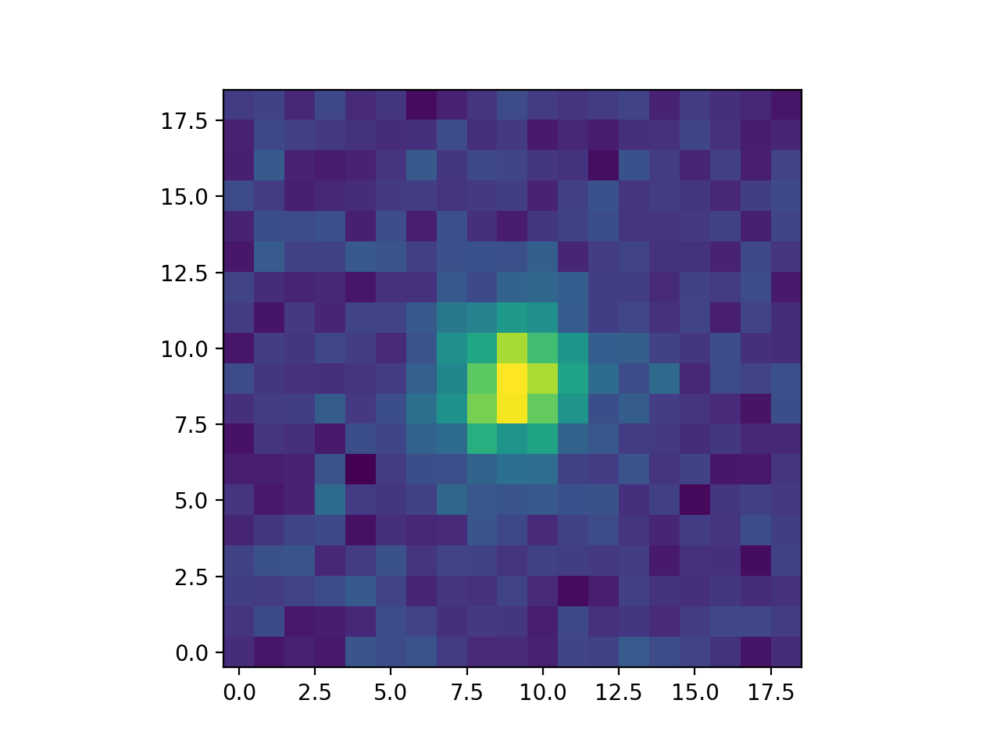

In [108]:
# u,v are local to this patch, but in sky coord.
data, weight, uarr, varr = aStar.data.getDataVector(include_zero_weight=True)
print(aStar.image.array.shape)
print(aStar.weight.array.shape)
print(uarr.shape)
print(uarr[179:182],varr[179:182])

moments = calculate_moments(aStar,errors=True, third_order=True, fourth_order=True, radial=True)
print(len(moments))
image = aStar.image

e0 = moments[3]
e1 = moments[4]
e2 = moments[5]
print('e0,e1,e2: ',e0,e1,e2)
print("u0,v0",moments[43],moments[44])

f,ax = plt.subplots(1,1)
ax.imshow(image.array,interpolation='None',origin='lower')

In [10]:
# image
hdu = fits.open("/nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz")
hdu.info()
print(hdu[1].header)

Filename: /nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       8   ()      
  1  SCI           1 CompImageHDU    314   (2048, 4096)   float32   
  2  MSK           1 CompImageHDU     65   (2048, 4096)   int16   
  3  WGT           1 CompImageHDU     22   (2048, 4096)   float32   
SIMPLE  =                    T / file does conform to FITS standard             BITPIX  =                  -32 / number of bits per data pixel                  NAXIS   =                    2 / number of data axes                            NAXIS1  =                 2048 / length of data axis 1                          NAXIS2  =                 4096 / length of data axis 2                          PCOUNT  =                    0 / size of special data area                      GCOUNT  =                    1 / one data group (required keyword)              XTENSION= 'BINTABLE'           

<IPython.core.display.Javascript object>


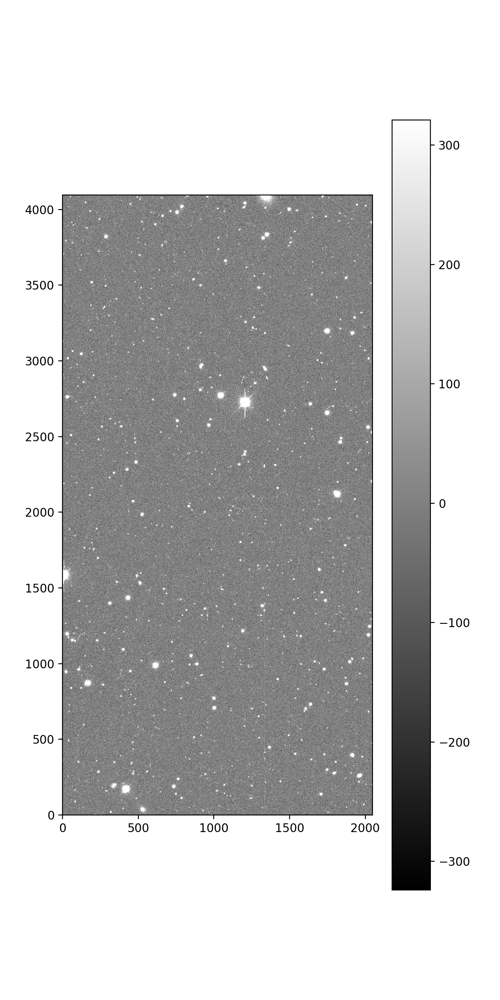

In [11]:
from astropy.visualization import imshow_norm, MinMaxInterval,LinearStretch,SqrtStretch,ZScaleInterval
f,ax = plt.subplots(1,1,figsize=(6,12))

im, norm = imshow_norm(hdu[1].data, ax, origin='lower', interpolation='None',cmap='gray',
                       interval=ZScaleInterval(),
                       stretch=LinearStretch())
f.colorbar(im)


<IPython.core.display.Javascript object>


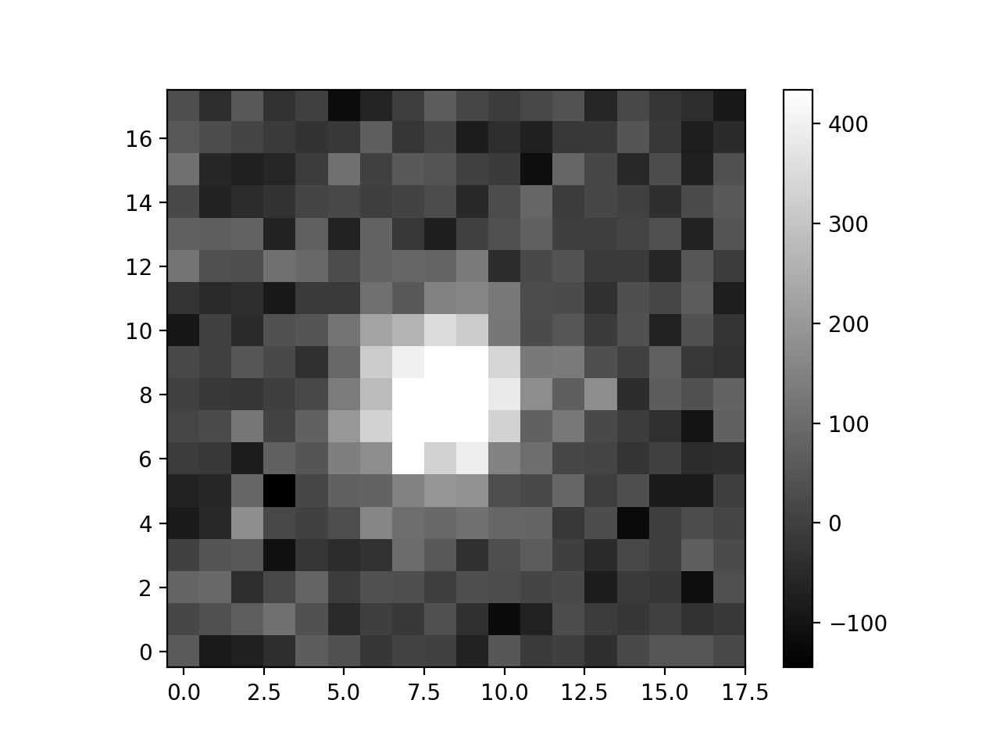

In [12]:
f,ax = plt.subplots(1,1)

# arguments to image data array are [iY,iX]  !

im, norm = imshow_norm(hdu[1].data[28:46,1086:1104], ax, origin='lower', interpolation='None',cmap='gray',
                       interval=ZScaleInterval(),
                       stretch=LinearStretch())
f.colorbar(im)

# Study weights inside Star object

<IPython.core.display.Javascript object>


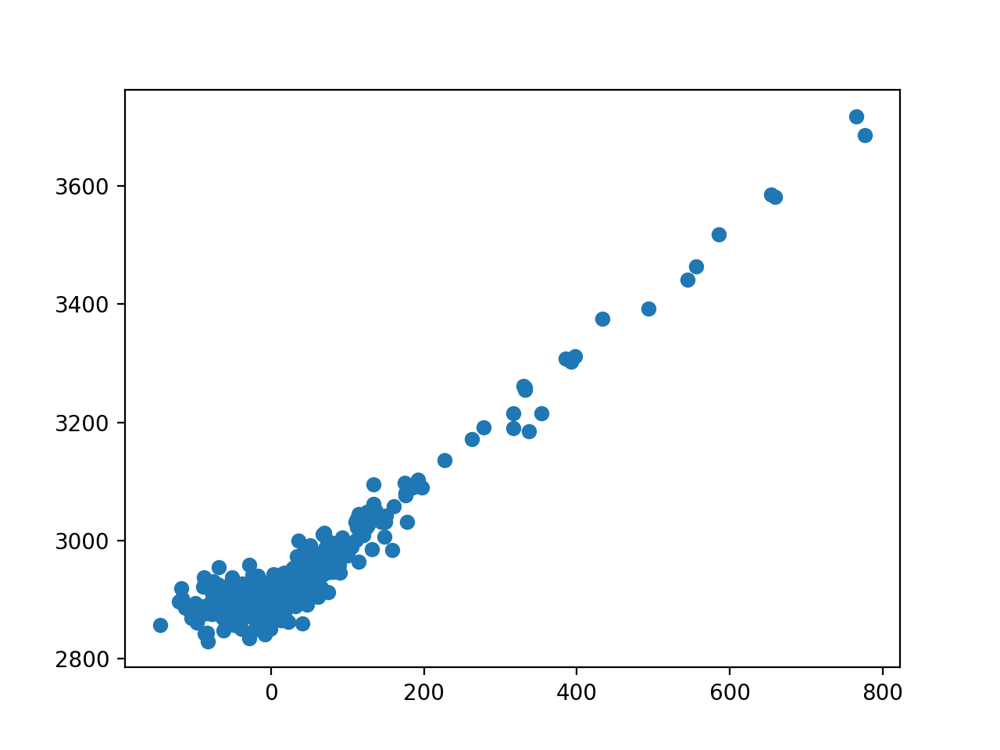

In [13]:
f,ax = plt.subplots(1,1)
ax.scatter(data,(1./weight))

Expect $\sigma^2 = F + S$ with F foreground subtracted from image and S signal, so $F \sim 2900$ here 

In [14]:
nbin = 19
halfsize = (nbin-1)/2 # for 19x19
ixs = np.linspace(-halfsize, halfsize, nbin)
ix,iy = np.meshgrid(ixs, ixs)
r = np.sqrt(ix*ix+iy*iy)
data2d = data.reshape((19,19))
noisesq2d = 1./weight.reshape((19,19))
radius = 3.
apert = (r<radius)
ring = (r>7.)
sumapert = np.sum(data2d[apert])
sumn = np.sum(apert)
skysum = np.sum(noisesq2d[ring])
skyn = np.sum(ring)
skyapert = skysum * sumn/skyn
#noise = 
print("Sum inside radius 4. = ",sumapert)  #noisy, but ok
print("Sky estimate inside radius 4. = ",skyapert)
print("SNR calc = ",sumapert/np.sqrt(skyapert))
print("SNR = ",aStar.data.properties['snr'])

Sum inside radius 4. =  10178.915
Sky estimate inside radius 4. =  72859.75261890539
SNR calc =  37.71009645580331
SNR =  38.87374001023927


# Get Star quantities 

In [104]:
def getStarsInfo(stars,radius=3.,ringradius=7.):
    nbin = 19
    halfsize = (nbin-1)/2 # for 19x19
    ixs = np.linspace(-halfsize, halfsize, nbin)
    ix,iy = np.meshgrid(ixs, ixs)
    r = np.sqrt(ix*ix+iy*iy)
    apert = (r<radius)
    ring = (r>ringradius)
    sumn = np.sum(apert)
    skyn = np.sum(ring)
    
    nstar = len(stars)
    flux = np.zeros(nstar)
    snr = np.zeros(nstar)
    snrt = np.zeros(nstar)
    sky = np.zeros(nstar)
    m00 = np.zeros(nstar)
    e0 = np.zeros(nstar)
    e1 = np.zeros(nstar)
    e2 = np.zeros(nstar)
    ra = np.zeros(nstar)
    dec = np.zeros(nstar)
    mmax = np.zeros(nstar)
    upos = np.zeros(nstar)
    vpos = np.zeros(nstar)
    vmeas = np.zeros(nstar) 
    umeas = np.zeros(nstar) 
    
    for i,aStar in enumerate(stars):
        data, weight, uarr, varr = aStar.data.getDataVector(include_zero_weight=True)
        data2d = data.reshape((nbin,nbin))
        noisesq2d = 1./weight.reshape((nbin,nbin))
        sumapert = np.sum(data2d[apert])        
        skysum = np.sum(noisesq2d[ring]-data2d[ring])
        skyapert = skysum * sumn/skyn
        
        flux[i] = sumapert
        snr[i] = sumapert/np.sqrt(skyapert)
        sky[i] = skysum/skyn
        snrt[i] = aStar.data.properties['snr']
        
        moments = calculate_moments(aStar,errors=False, third_order=False, fourth_order=False, radial=False)
    
        m00[i] = moments[0]
        e0[i] = moments[3]
        e1[i] = moments[4]
        e2[i] = moments[5]
        
        ra_s = Angle(aStar.data.properties['ra'], u.hourangle)
        dec_s = Angle(aStar.data.properties['dec'], u.deg)
        ra[i] = ra_s.deg
        dec[i] = dec_s.deg
        
        mmax[i] = np.max(data)
        
        upos[i] = aStar.data.properties['u']
        vpos[i] = aStar.data.properties['v']
        
        du0,dv0 = calcUVlocal(aStar)
        umeas[i] = du0
        vmeas[i] = dv0
        
    return flux,sky,snr,snrt,e0,e1,e2,ra,dec,m00,mmax,upos,vpos,umeas,vmeas

In [105]:
flux,sky,snr,snrt,e0,e1,e2,ra,dec,m00,mmax,upos,vpos,umeas,vmeas = getStarsInfo(stars)

HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed
HSM failed


<IPython.core.display.Javascript object>


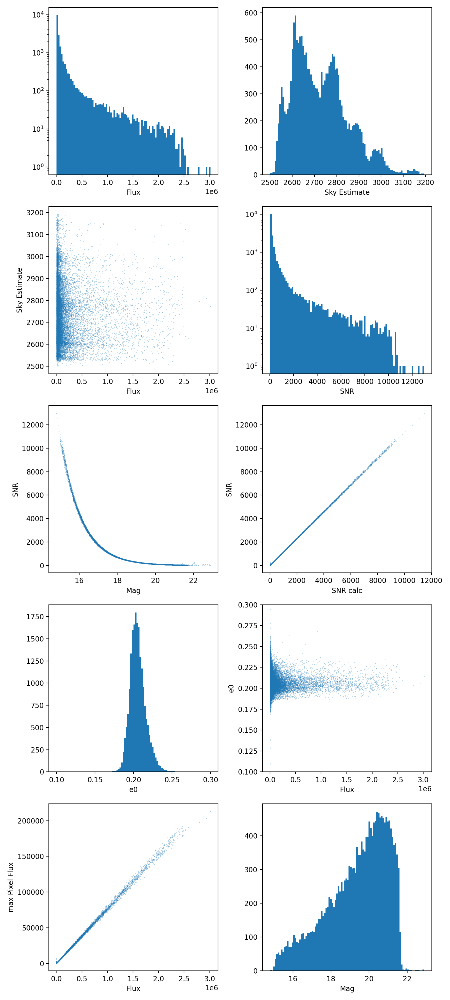

In [17]:
f,ax = plt.subplots(5,2,figsize=(9,20))
axf = ax.flatten()

h = axf[0].hist(flux,bins=100)
axf[0].set_yscale('log')
axf[0].set_xlabel('Flux')
h = axf[1].hist(sky,bins=100)
axf[1].set_xlabel('Sky Estimate')
h = axf[2].scatter(flux,sky,marker='.',s=0.1)
axf[2].set_xlabel('Flux')
axf[2].set_ylabel('Sky Estimate')
h = axf[3].hist(snrt,bins=100)
axf[3].set_xlabel("SNR")
axf[3].set_yscale('log')
h = axf[4].scatter(-2.5*np.log10(flux)+31.,snrt,marker='.',s=0.1)
axf[4].set_xlabel('Mag')
axf[4].set_ylabel('SNR')
h = axf[5].scatter(snr,snrt,marker='.',s=0.1)
axf[5].set_xlabel('SNR calc')
axf[5].set_ylabel('SNR')
h = axf[6].hist(e0,bins=100,range=(0.1,0.3))
axf[6].set_xlabel('e0')
h = axf[7].scatter(flux,e0,marker='.',s=0.1)
axf[7].set_xlabel('Flux')
axf[7].set_ylabel('e0')
axf[7].set_ylim(0.1,0.3)
h = axf[8].scatter(flux,mmax,marker='.',s=0.1)
axf[8].set_xlabel('Flux')
axf[8].set_ylabel('max Pixel Flux')
h = axf[9].hist(-2.5*np.log10(flux)+31.,bins=100)
axf[9].set_xlabel('Mag')

f.tight_layout()

<IPython.core.display.Javascript object>


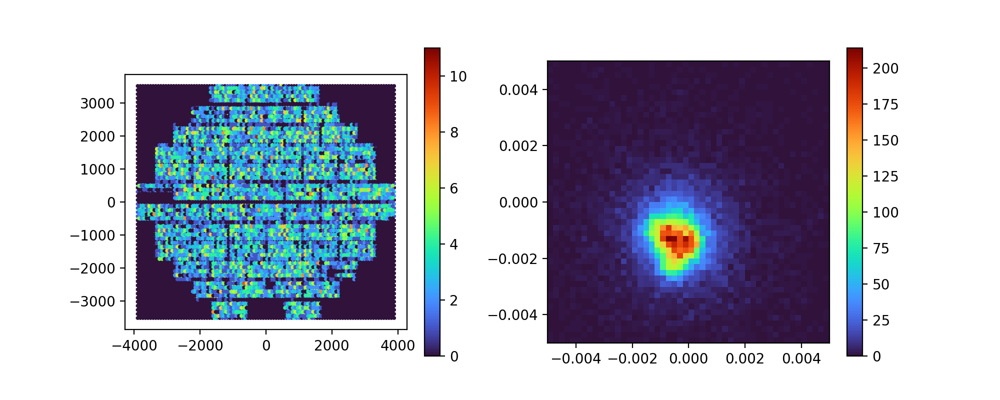

In [18]:
f,ax = plt.subplots(1,2,figsize=(10,4))
im = ax[0].hexbin(upos,vpos,gridsize=100,cmap=cm.turbo)
ax[0].set_aspect('equal')
plt.colorbar(im,ax=ax[0])
h = ax[1].hist2d(umeas,vmeas,bins=(50,50),range=((-0.005,0.005),(-0.005,0.005)),cmap=cm.turbo)
ax[1].set_aspect('equal')
plt.colorbar(h[3],ax=ax[1])




# Check u,v and Image pointing Coordinates, confirm understand of coordinate systems

In [19]:
decaminfo = piff.des.DECamInfo()    

print('Focal Plane position [mm]: ',decaminfo.getPosition_chipnum(np.array([1]), [1095], [36.8]))


Focal Plane position [mm]:  (array([-184.9155]), array([-94.0505]))


In [20]:
# this is the center of the field of view, ie. Pointing
pointing = aStar.data.pointing
print(pointing)
ra_p = pointing.ra
dec_p = pointing.dec
print("Pointing RA,dec [D,D] = ",ra_p.deg,dec_p.deg)
print(type(ra))

ra_a = Angle(ra_p.deg,u.deg)
dec_a = Angle(dec_p.deg,u.deg)
pointing_c = SkyCoord(ra_a,dec_a,frame='fk5')

coord.CelestialCoord(5.767378117694502 radians, -0.9495312291199803 radians)
Pointing RA,dec [D,D] =  330.4464249999999 -54.404131944444444
<class 'numpy.ndarray'>


In [21]:
# here are the RA,dec of our star
ra_star = Angle(aStar.data.properties['ra'],u.hourangle)
dec_star = Angle(aStar.data.properties['dec'],u.deg)
print('RA,dec [D,D]',ra_star.deg,dec_star.deg)

radec_star = SkyCoord(ra_star,dec_star, frame='fk5')
print(radec_star)

RA,dec [D,D] 329.6811396973826 -53.501282582675856
<SkyCoord (FK5: equinox=J2000.000): (ra, dec) in deg
    (329.6811397, -53.50128258)>


In [22]:
# distance from star to pointing
dra, ddec = pointing_c.spherical_offsets_to(radec_star)
print(dra.arcsec,ddec.arcsec)

-1638.8741855906637 3241.3578012333537


these dra,ddec match the u,v (dra=-u and ddec = v) above!!

# Match Stars to Gaia catalog, compare magnitudes

In [23]:
Gaia.ROW_LIMIT = -1.
radius = u.Quantity(1.1, u.deg)
gcone = Gaia.cone_search_async(pointing_c, radius)
resultG = gcone.get_results()
resultG.pprint()


INFO: Query finished. [astroquery.utils.tap.core]
    solution_id             designation          ...         dist        
                                                 ...                     
------------------- ---------------------------- ... --------------------
1635721458409799680 Gaia DR2 6509187387091659136 ... 0.011969360454985839
1635721458409799680 Gaia DR2 6509187318372045696 ... 0.015156505777044374
1635721458409799680 Gaia DR2 6509187387092313856 ... 0.015600409288059405
1635721458409799680 Gaia DR2 6509187352731782528 ... 0.016180300338258367
1635721458409799680 Gaia DR2 6509187314077003776 ... 0.018349379216622795
1635721458409799680 Gaia DR2 6509187387092253568 ... 0.019672720419930304
1635721458409799680 Gaia DR2 6509187829473114240 ... 0.023756379679841115
1635721458409799680 Gaia DR2 6509187284013039232 ...  0.02649396506700105
1635721458409799680 Gaia DR2 6509187558890210816 ... 0.028889480324211535
1635721458409799680 Gaia DR2 6509187146573486336 ... 0.0295207

In [24]:
print(resultG.columns)

<TableColumns names=('solution_id','designation','source_id','random_index','ref_epoch','ra','ra_error','dec','dec_error','parallax','parallax_error','parallax_over_error','pmra','pmra_error','pmdec','pmdec_error','ra_dec_corr','ra_parallax_corr','ra_pmra_corr','ra_pmdec_corr','dec_parallax_corr','dec_pmra_corr','dec_pmdec_corr','parallax_pmra_corr','parallax_pmdec_corr','pmra_pmdec_corr','astrometric_n_obs_al','astrometric_n_obs_ac','astrometric_n_good_obs_al','astrometric_n_bad_obs_al','astrometric_gof_al','astrometric_chi2_al','astrometric_excess_noise','astrometric_excess_noise_sig','astrometric_params_solved','astrometric_primary_flag','astrometric_weight_al','astrometric_pseudo_colour','astrometric_pseudo_colour_error','mean_varpi_factor_al','astrometric_matched_observations','visibility_periods_used','astrometric_sigma5d_max','frame_rotator_object_type','matched_observations','duplicated_source','phot_g_n_obs','phot_g_mean_flux','phot_g_mean_flux_error','phot_g_mean_flux_over_er

<IPython.core.display.Javascript object>


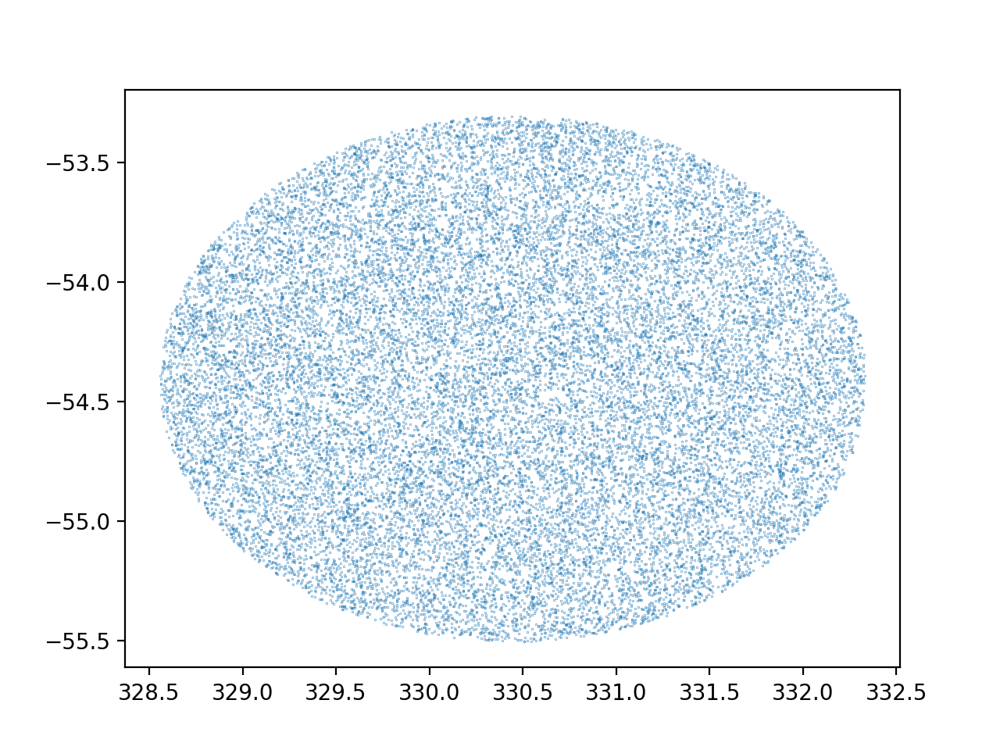

In [25]:
f,ax = plt.subplots(1,1)
h = ax.scatter(resultG['ra'],resultG['dec'],marker='.',s=0.1)

<IPython.core.display.Javascript object>


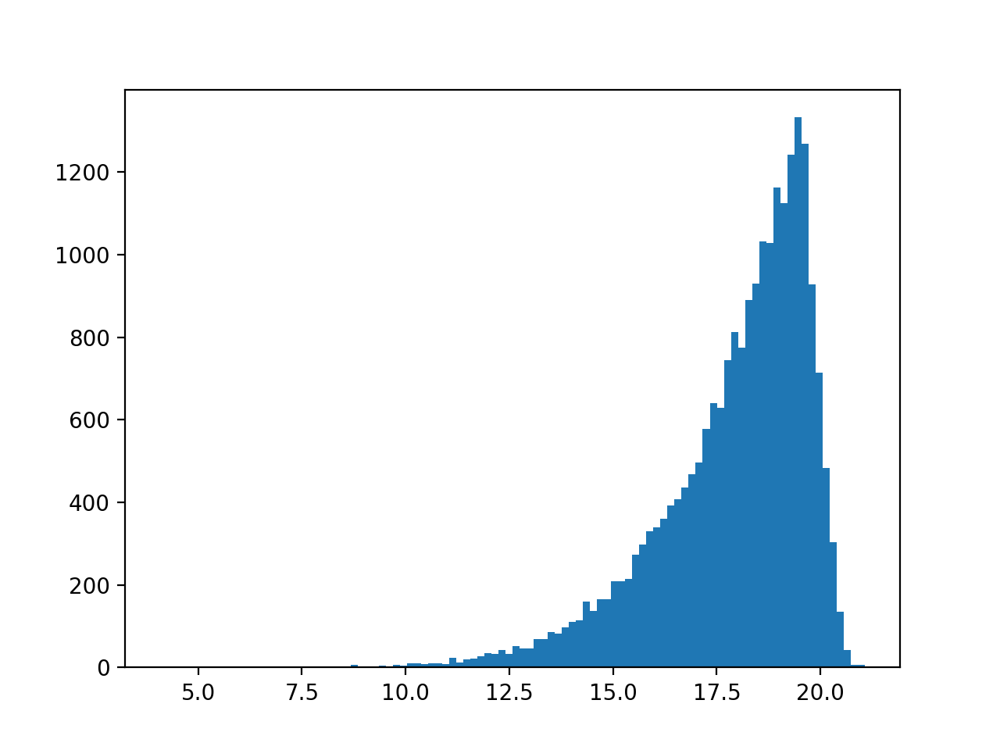

In [26]:
f,ax = plt.subplots(1,1)
h = ax.hist(resultG['phot_rp_mean_mag'],bins=100)

In [27]:
hmat = htm.HTM(10)
ra2 = resultG['ra']
dec2 = resultG['dec']
m1,m2,d12 = hmat.match(ra,dec,ra2,dec2,2.0/3600.,maxmatch=1)
print(len(ra),len(ra2),len(m1))

19818 24983 12551


<IPython.core.display.Javascript object>


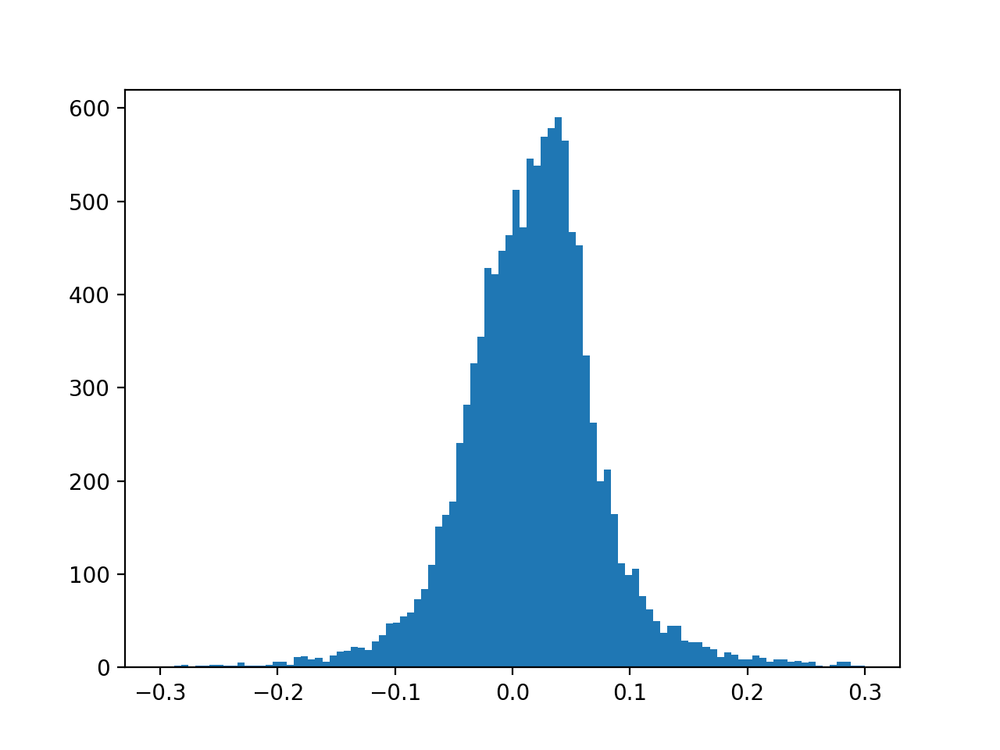

In [28]:
f,ax = plt.subplots(1,1)
h = ax.hist(-2.5*np.log10(flux[m1])+30.95-resultG['phot_rp_mean_mag'][m2],bins=100,range=(-0.3,0.3))

<IPython.core.display.Javascript object>


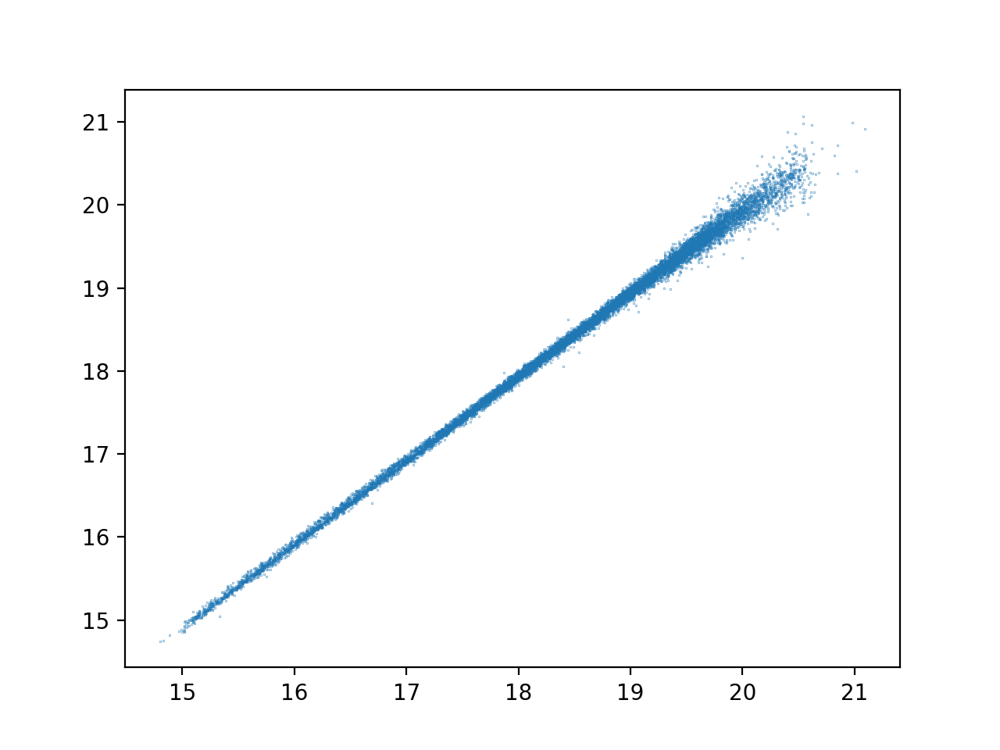

In [29]:
f,ax = plt.subplots(1,1)
h = ax.scatter(-2.5*np.log10(flux[m1])+31.0,resultG['phot_rp_mean_mag'][m2],marker='.',s=0.1)

<IPython.core.display.Javascript object>


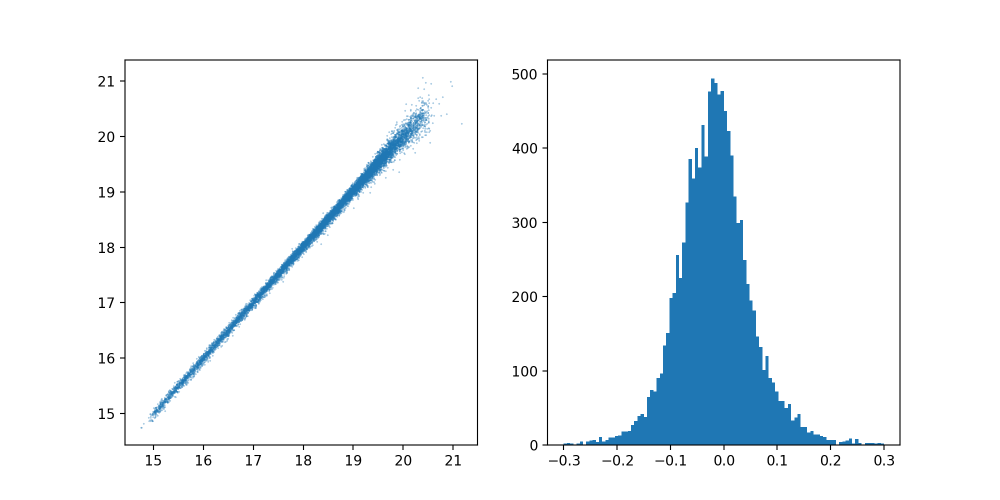

In [30]:
f,ax = plt.subplots(1,2,figsize=(10,5))
h = ax[0].scatter(-2.5*np.log10(m00[m1])+30.25,resultG['phot_rp_mean_mag'][m2],marker='.',s=0.1)
h = ax[1].hist(-2.5*np.log10(m00[m1])+30.25-resultG['phot_rp_mean_mag'][m2],bins=100,range=(-0.3,0.3))

<IPython.core.display.Javascript object>


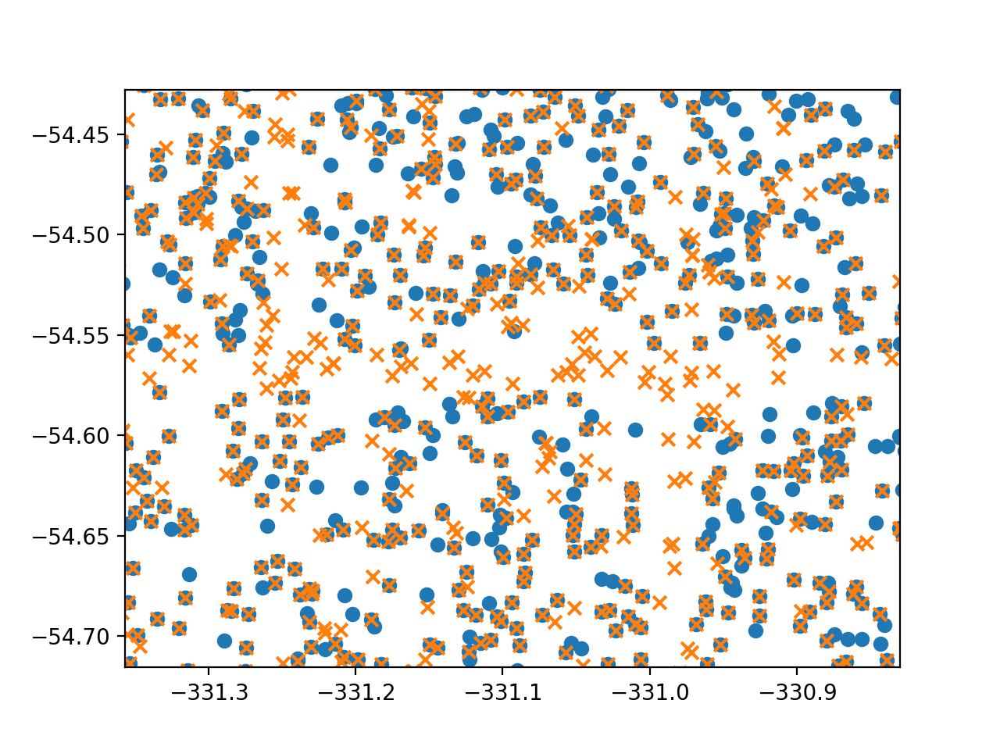

In [31]:
f,ax = plt.subplots(1,1)
h = ax.scatter(-ra,dec,marker='o')
h = ax.scatter(-ra2,dec2,marker='x')


previously, with the nuisance cut at 7.5, there were only 10728/17985 Piff stars matched to Gaia and there weren't any stars brighter than 16.7 mag in Piff's list of stars

In [32]:
# m1 has the index of everything matched, make a flag for which of ra,dec arrays are matched
ismatched = np.full(len(ra),False)
ismatched[m1] = True
print(ismatched[0:10])

[False False  True  True  True False False  True False False]


<IPython.core.display.Javascript object>


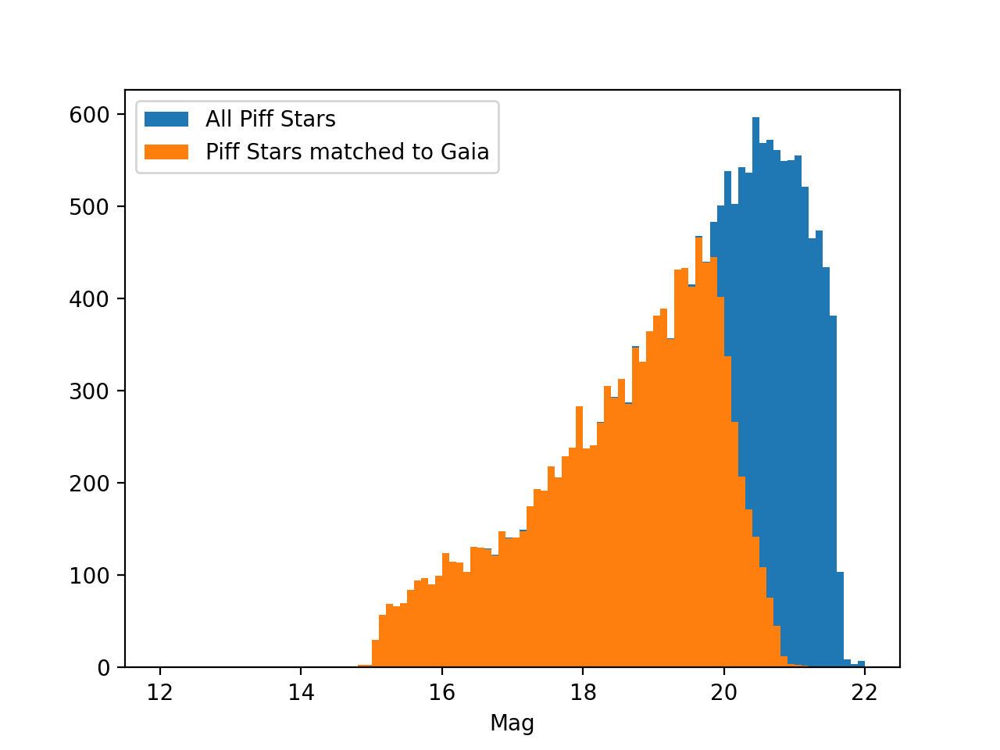

In [33]:
f,ax = plt.subplots(1,1)
h = ax.hist(-2.5*np.log10(flux)+31.0,bins=100,range=(12.,22.),label='All Piff Stars')
h = ax.hist(-2.5*np.log10(flux[ismatched])+31.0,bins=100,range=(12.,22.),label='Piff Stars matched to Gaia')
ax.set_xlabel("Mag")
ax.legend()

Unmatched Piff stars are below about 20th mag -ie. below Gaia threshold

Now Piff stars go down to Mag 15.  Why nothing brighter?

# Study nuisance cut

In [34]:
def calcRing(stars,stamp_size=19,cutoff_nuisance_level=7.5):
    
    half = (stamp_size-1)/2
    ixs = half - np.arange(stamp_size)    
    ix,iy = np.meshgrid(ixs, ixs)
    r = np.sqrt(ix*ix+iy*iy)
    radius = (stamp_size-1.0)*(5.0/12.0)
    ring = (r>radius)

    flux_extras = []
    for star_i, star in enumerate(stars):
        if star.image.array.shape[0] != stamp_size or star.image.array.shape[1] != stamp_size:
            flux_extras.append(np.nan)
        else: 
            flux_extra = np.sum(star.image.array[ring])
            flux_extras.append(flux_extra)

    flux_extras = np.array(flux_extras)
    med = np.nanmedian(flux_extras)
    mad = np.nanmedian(np.abs(flux_extras-med[None]))
    madx = np.abs(flux_extras - med[None])
    fail = (madx > 1.48 * cutoff_nuisance_level * mad)

    return flux_extras,fail


In [35]:
fluxring,fail = calcRing(stars)

<IPython.core.display.Javascript object>


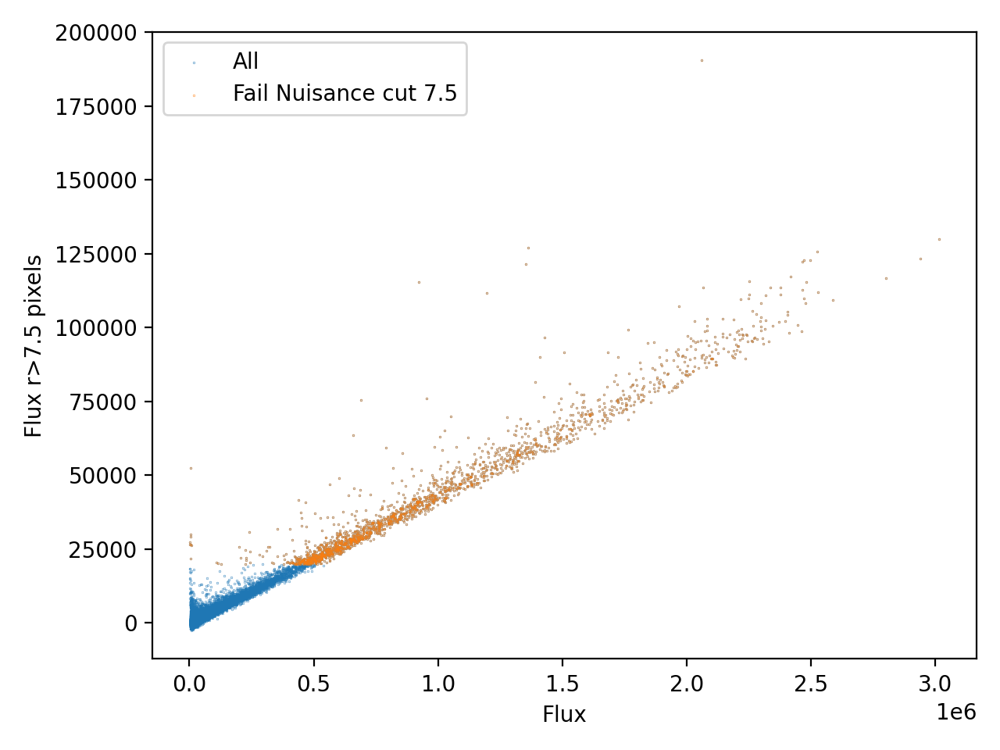

In [36]:
f,ax = plt.subplots(1,1)
h = ax.scatter(flux,fluxring,marker='.',s=0.1,label='All')
h = ax.scatter(flux[fail],fluxring[fail],marker='.',s=0.1,label='Fail Nuisance cut 7.5')
ax.set_xlabel('Flux')
ax.set_ylabel('Flux r>7.5 pixels')
ax.legend()
f.tight_layout()

<IPython.core.display.Javascript object>


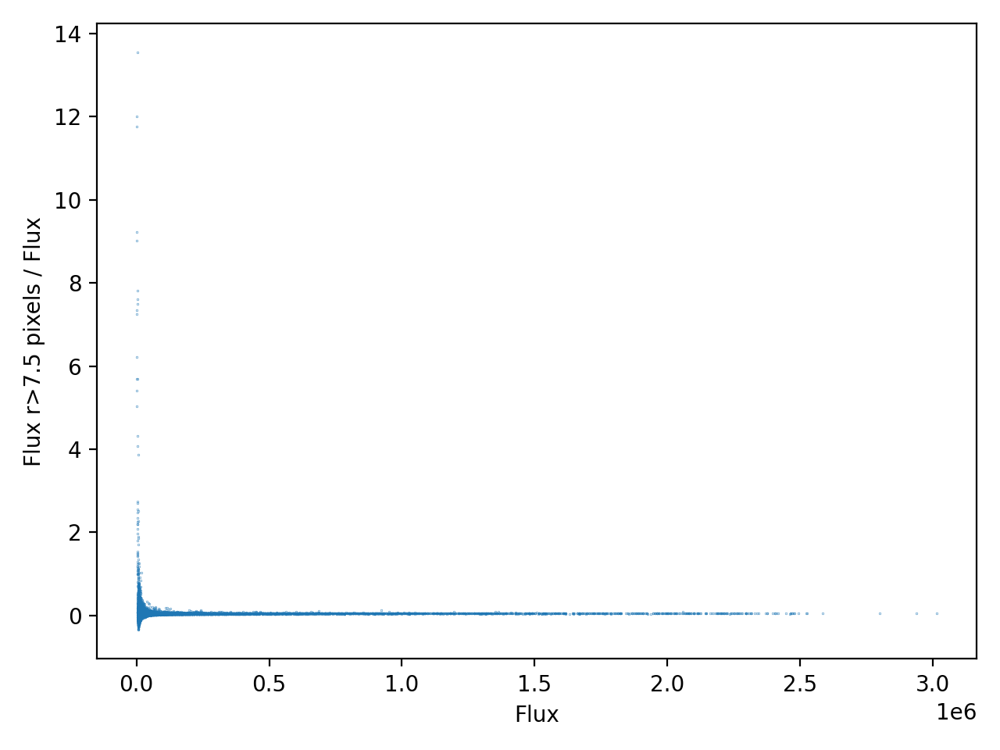

In [37]:
f,ax = plt.subplots(1,1)
h = ax.scatter(flux,fluxring/flux,marker='.',s=0.1,label='All')
ax.set_xlabel('Flux')
ax.set_ylabel('Flux r>7.5 pixels / Flux')
f.tight_layout()

<IPython.core.display.Javascript object>


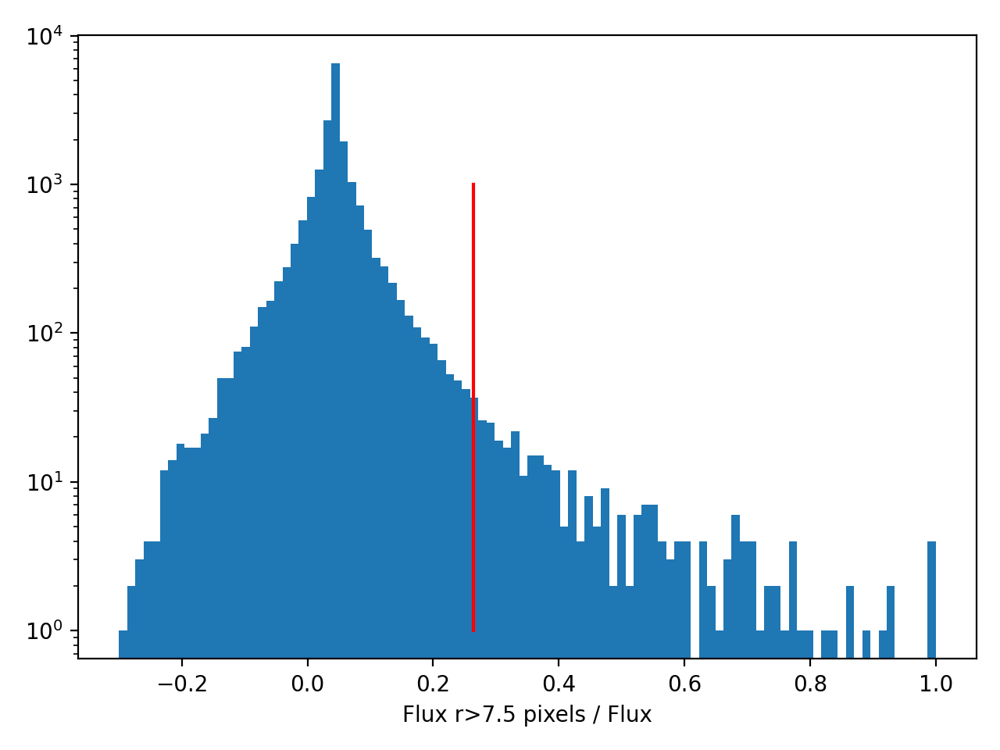

In [38]:
f,ax = plt.subplots(1,1)
h = ax.hist(fluxring/flux,bins=100,range=(-0.3,1.0))
ax.set_xlabel('Flux r>7.5 pixels / Flux')
ax.set_yscale('log')
f.tight_layout()

fratio = fluxring/flux
median_fratio = np.median(fratio)
mad_fratio = sp.stats.median_abs_deviation(fratio)
cutval = median_fratio + 15.*mad_fratio

l = lines.Line2D([cutval,cutval], [1.0,1.0e3],color='red')
ax.add_line(l)

In [39]:
# Gallery of stars above this cut
failratiocut = (fratio>cutval)
nfail = np.sum(failratiocut)
print("%d stars fail this cut" % nfail)

failedstars = []
for i,star in enumerate(stars):
    if failratiocut[i]:
        failedstars.append(star) 


394 stars fail this cut


<IPython.core.display.Javascript object>


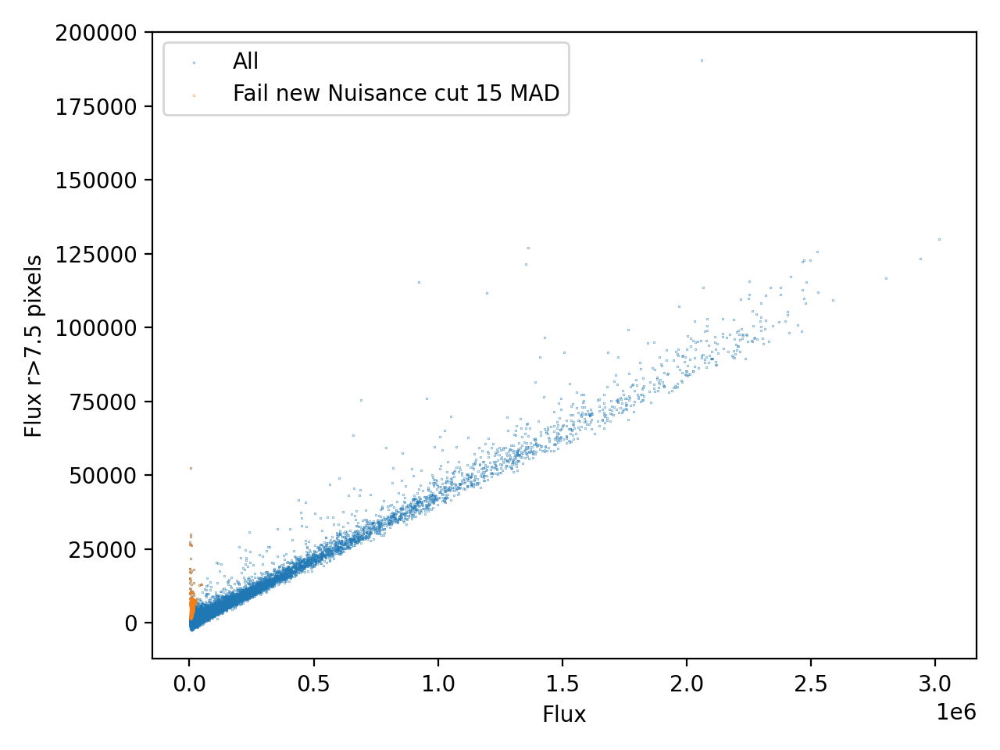

In [40]:
f,ax = plt.subplots(1,1)
h = ax.scatter(flux,fluxring,marker='.',s=0.1,label='All')
h = ax.scatter(flux[failratiocut],fluxring[failratiocut],marker='.',s=0.1,label='Fail new Nuisance cut 15 MAD')
ax.set_xlabel('Flux')
ax.set_ylabel('Flux r>7.5 pixels')
ax.legend()
f.tight_layout()

<IPython.core.display.Javascript object>


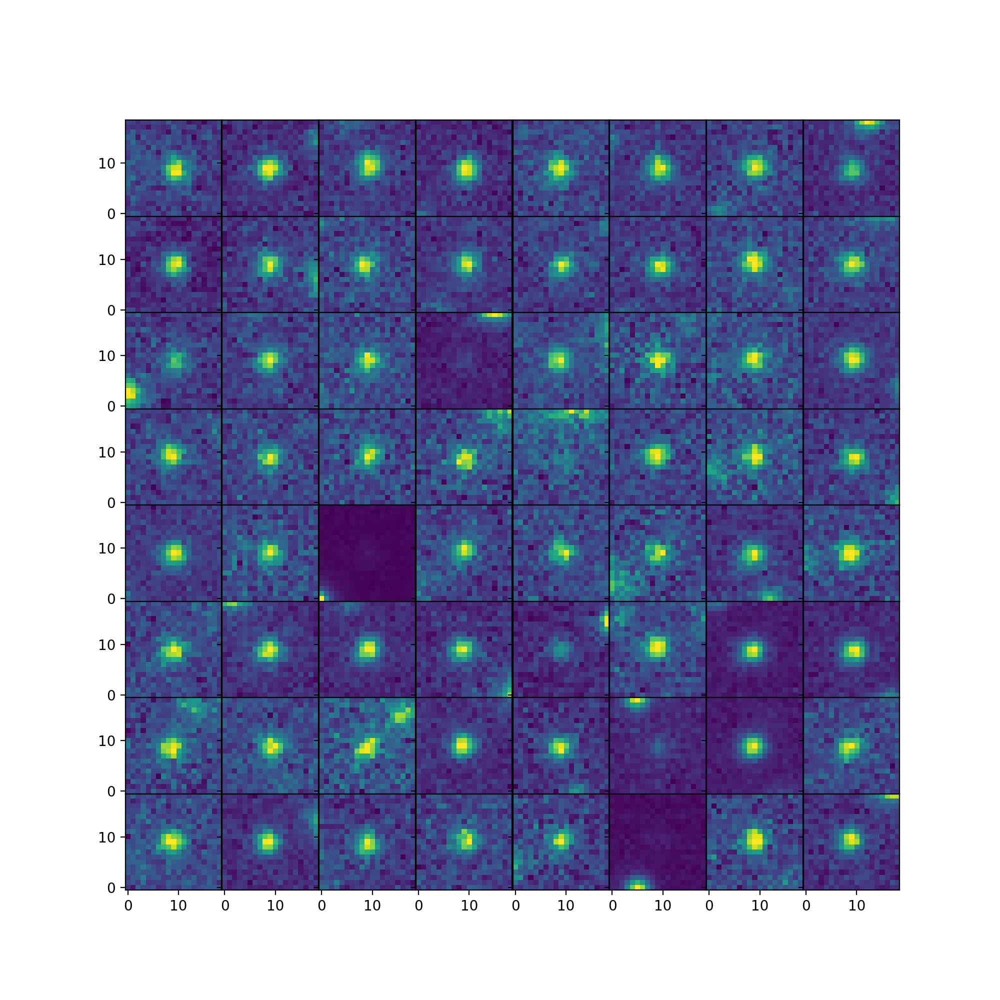

In [41]:
f,ax = plt.subplots(8,8,sharex=True,sharey=True,figsize=(10,10))
axf = ax.flatten()
for i,star in enumerate(failedstars):
    if i<64:
        im = axf[i].imshow(star.image.array,interpolation='None',origin='lower')
        
plt.subplots_adjust(wspace=0, hspace=0)


a MAD of 15 would be a reasonble cut to remove nuisance stars, with no impact on the typical sky foreground subtraction. Note how long the negative tail is for the flux ratio...

In [42]:
alpha = np.nanmedian(fluxring[(flux>3.e5)]/flux[(flux>3.e5)])
print(alpha)
fluxringc = fluxring - alpha*flux
frmad = sp.stats.median_abs_deviation(fluxringc)
frsnr = fluxringc/frmad
frsnrcut = (frsnr>7.)

0.04334060778516907


<IPython.core.display.Javascript object>


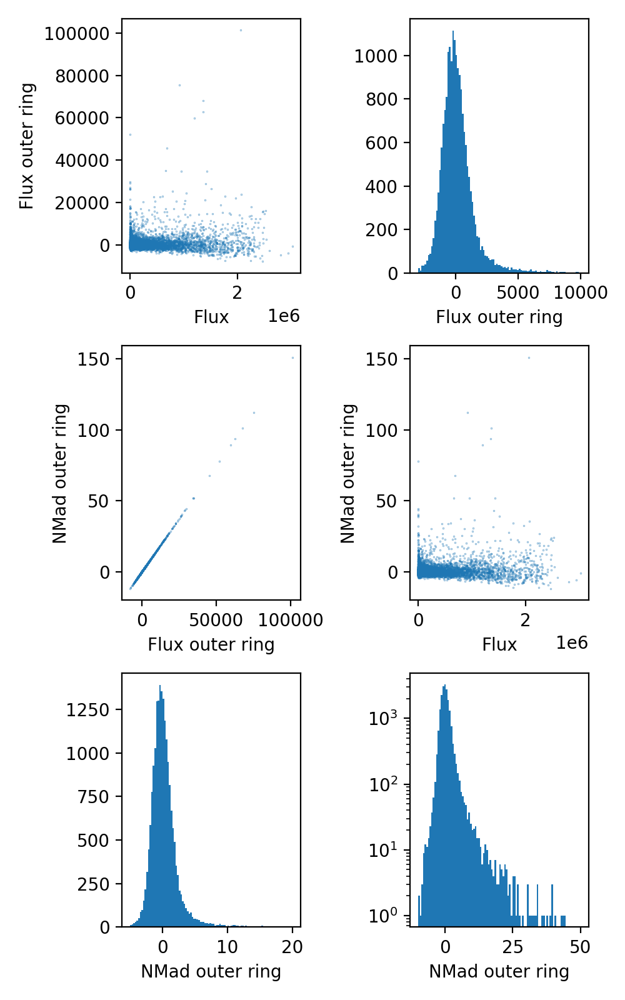

In [43]:
f,ax = plt.subplots(3,2,figsize=(5,8))
axf = ax.flatten()
axf[0].scatter(flux,fluxringc,marker='.',s=0.1)
axf[0].set_xlabel('Flux')
axf[0].set_ylabel('Flux outer ring')
axf[1].hist(fluxringc,bins=100,range=(-3e3,10e3))
axf[1].set_yscale('linear')
axf[1].set_xlabel('Flux outer ring')

axf[2].scatter(fluxringc,frsnr,marker='.',s=0.1)
axf[2].set_xlabel('Flux outer ring')
axf[2].set_ylabel('NMad outer ring')
axf[3].scatter(flux,frsnr,marker='.',s=0.1)
axf[3].set_xlabel('Flux')
axf[3].set_ylabel('NMad outer ring')


axf[4].hist(frsnr,bins=100,range=(-5.,20.))
axf[4].set_yscale('linear')
axf[4].set_xlabel('NMad outer ring')
axf[5].hist(frsnr,bins=100,range=(-10.,50.))
axf[5].set_yscale('log')
axf[5].set_xlabel('NMad outer ring')

f.tight_layout()

In [44]:
# Gallery of stars above this cut
nfail = np.sum(frsnrcut)
print("%d stars fail this cut" % nfail)

failedstarsB = []
for i,star in enumerate(stars):
    if frsnrcut[i]:
        failedstarsB.append(star) 

431 stars fail this cut


<IPython.core.display.Javascript object>


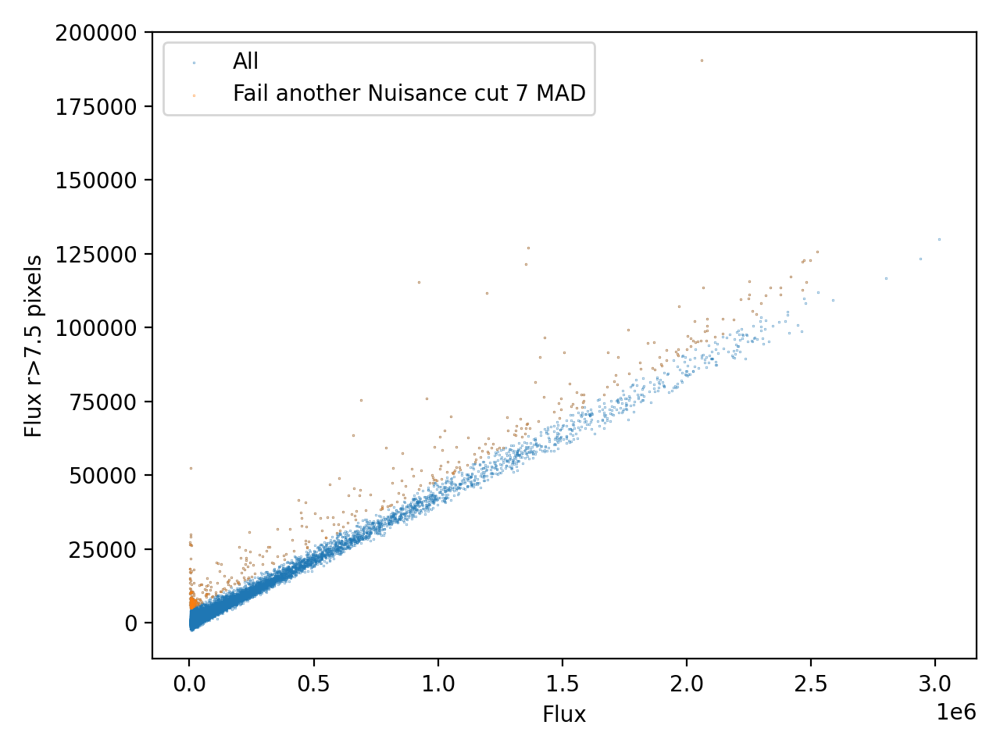

In [45]:
f,ax = plt.subplots(1,1)
h = ax.scatter(flux,fluxring,marker='.',s=0.1,label='All')
h = ax.scatter(flux[frsnrcut],fluxring[frsnrcut],marker='.',s=0.1,label='Fail another Nuisance cut 7 MAD')
ax.set_xlabel('Flux')
ax.set_ylabel('Flux r>7.5 pixels')
ax.legend()
f.tight_layout()

/nfs/slac/g/ki/ki06/roodman/Software/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


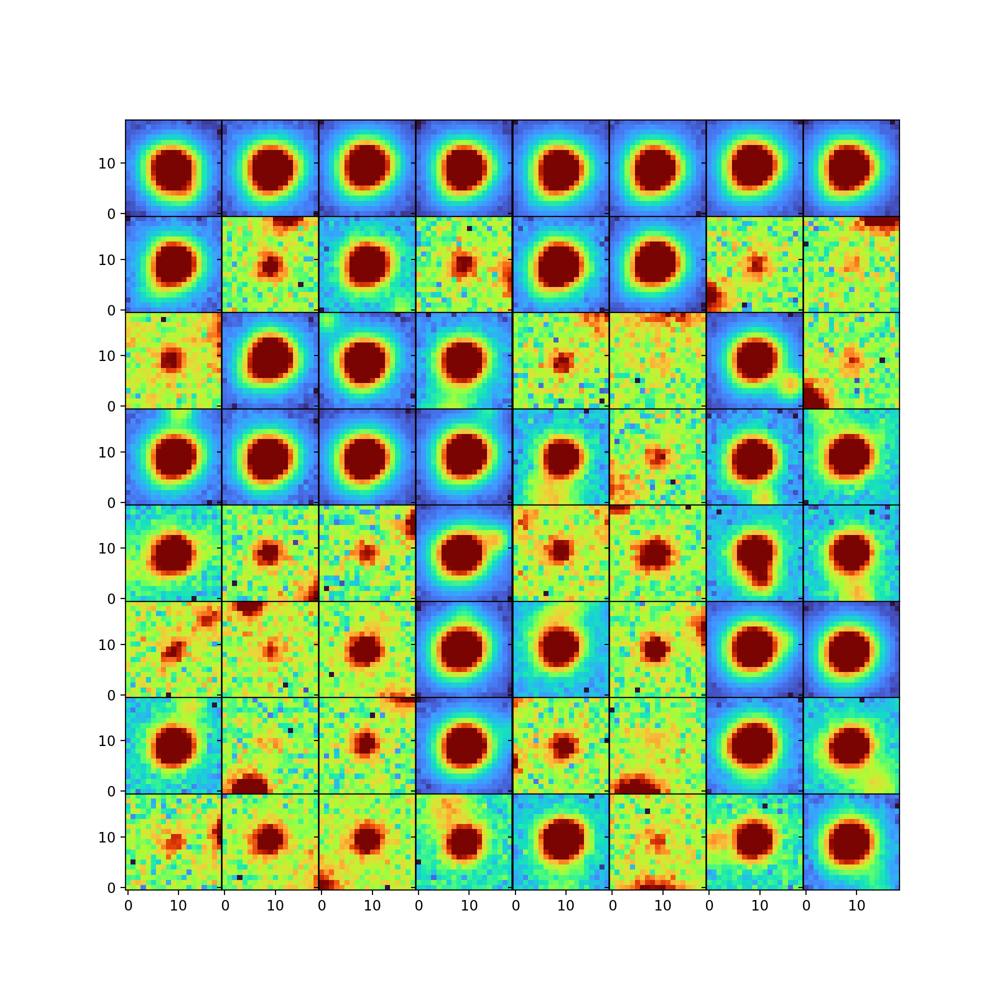

In [46]:
f,ax = plt.subplots(8,8,sharex=True,sharey=True,figsize=(10,10))
axf = ax.flatten()
for i,star in enumerate(failedstarsB):
    if i<64:
        #im = axf[i].imshow(star.image.array,interpolation='None',origin='lower')
        im, norm = imshow_norm(star.image.array, axf[i], origin='lower', interpolation='None',cmap=cm.turbo,
                       interval=ZScaleInterval(),
                       stretch=SqrtStretch())
plt.subplots_adjust(wspace=0, hspace=0)



<IPython.core.display.Javascript object>


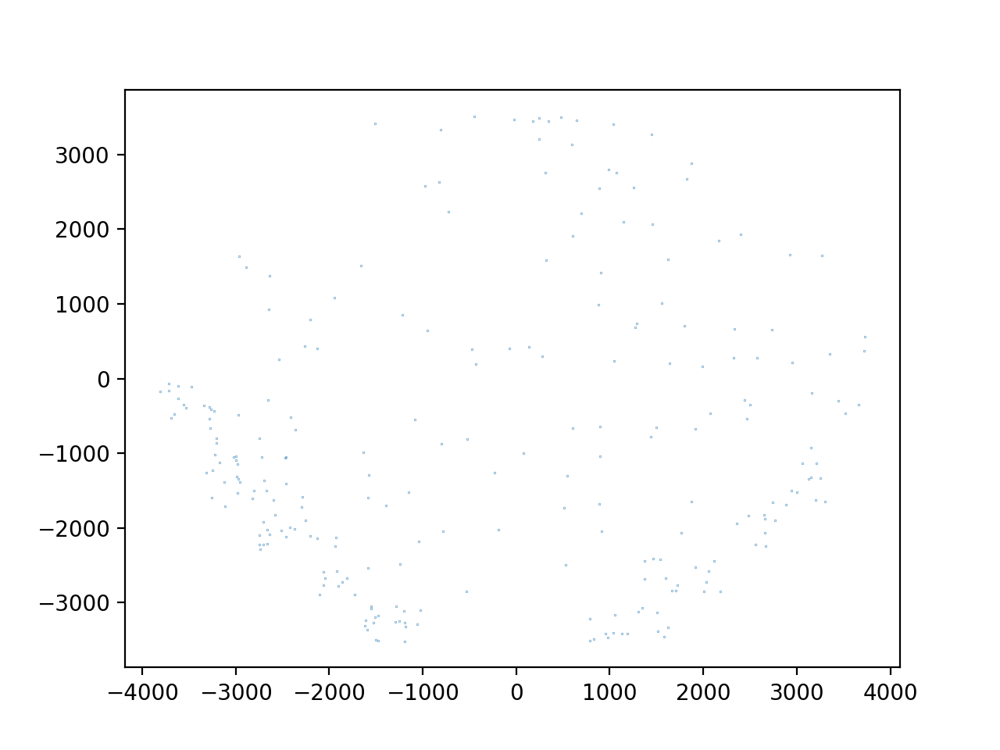

In [122]:
ximage = []
yimage = []
uall = []
vall = []
for i,aStar in enumerate(failedstarsB):
    fsum = np.sum(aStar.data.image.array)
    if fsum>3.e5:
        ximage.append(aStar.image_pos.x-int(aStar.image_pos.x))
        yimage.append(aStar.image_pos.y-int(aStar.image_pos.y))
        uall.append(aStar.field_pos.x)
        vall.append(aStar.field_pos.y)
f,ax = plt.subplots(1,1)
ax.scatter(uall,vall,marker='.',s=0.1)

Many stars with extra flux are rejected, but some ok stars are too.  Are these ok stars just offset from the center of the postage stamp?

<IPython.core.display.Javascript object>


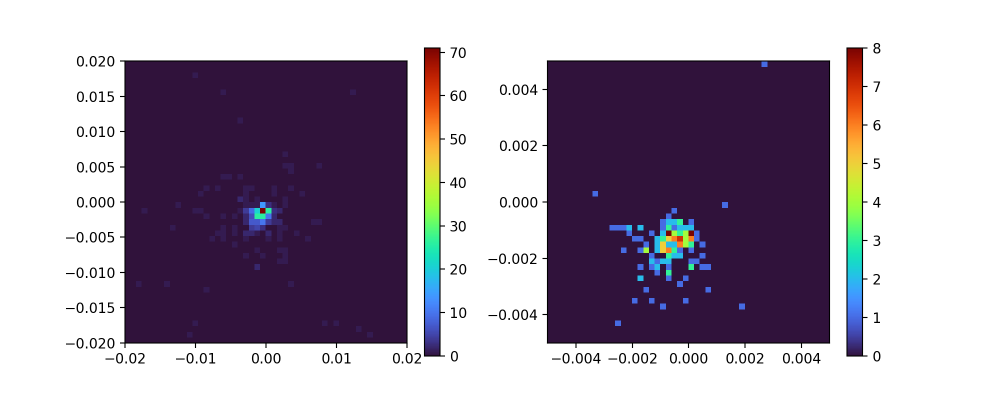

In [47]:
f,ax = plt.subplots(1,2,figsize=(10,4))
h = ax[0].hist2d(umeas[frsnrcut],vmeas[frsnrcut],bins=(50,50),range=((-0.02,0.02),(-0.02,0.02)),cmap=cm.turbo)
ax[0].set_aspect('equal')
plt.colorbar(h[3],ax=ax[0])
hiflux = (flux>5.e5)
h = ax[1].hist2d(umeas[(frsnrcut&hiflux)],vmeas[(frsnrcut&hiflux)],bins=(50,50),range=((-0.005,0.005),(-0.005,0.005)),cmap=cm.turbo)
ax[1].set_aspect('equal')
plt.colorbar(h[3],ax=ax[1])

<IPython.core.display.Javascript object>


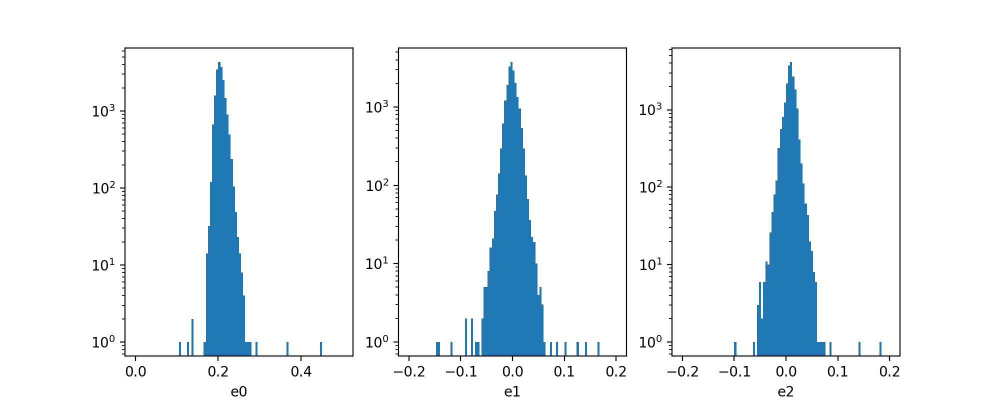

In [48]:
f,ax = plt.subplots(1,3,figsize=(10,4))
h = ax[0].hist(e0,bins=100,range=(0.,0.5))
ax[0].set_xlabel('e0')
ax[0].set_yscale('log')
h = ax[1].hist(e1,bins=100,range=(-0.2,0.2))
ax[1].set_xlabel('e1')
ax[1].set_yscale('log')
h = ax[2].hist(e2,bins=100,range=(-0.2,0.2))
ax[2].set_xlabel('e2')
ax[2].set_yscale('log')

<IPython.core.display.Javascript object>


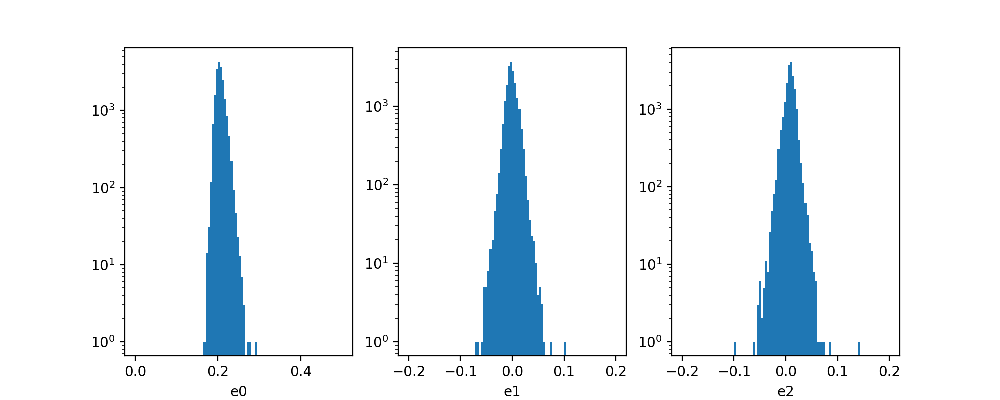

In [49]:
f,ax = plt.subplots(1,3,figsize=(10,4))
h = ax[0].hist(e0[~frsnrcut],bins=100,range=(0.,0.5))
ax[0].set_xlabel('e0')
ax[0].set_yscale('log')
h = ax[1].hist(e1[~frsnrcut],bins=100,range=(-0.2,0.2))
ax[1].set_xlabel('e1')
ax[1].set_yscale('log')
h = ax[2].hist(e2[~frsnrcut],bins=100,range=(-0.2,0.2))
ax[2].set_xlabel('e2')
ax[2].set_yscale('log')

<IPython.core.display.Javascript object>


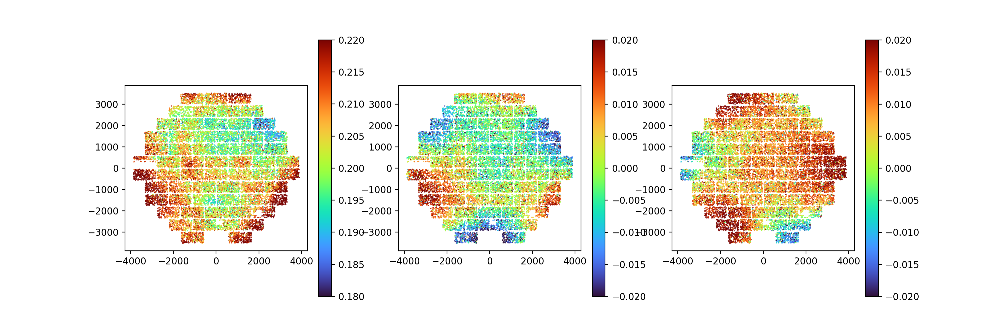

In [50]:
f,ax = plt.subplots(1,3,figsize=(15,5))
im = ax[0].hexbin(upos[~frsnrcut],vpos[~frsnrcut],e0[~frsnrcut],gridsize=500,cmap=cm.turbo,vmin=0.18,vmax=0.22)
ax[0].set_aspect('equal')
plt.colorbar(im,ax=ax[0])
im = ax[1].hexbin(upos[~frsnrcut],vpos[~frsnrcut],e1[~frsnrcut],gridsize=500,cmap=cm.turbo,vmin=-0.02,vmax=0.02)
ax[1].set_aspect('equal')
plt.colorbar(im,ax=ax[1])
im = ax[2].hexbin(upos[~frsnrcut],vpos[~frsnrcut],e2[~frsnrcut],gridsize=500,cmap=cm.turbo,vmin=-0.02,vmax=0.02)
ax[2].set_aspect('equal')
plt.colorbar(im,ax=ax[2])
    

<IPython.core.display.Javascript object>


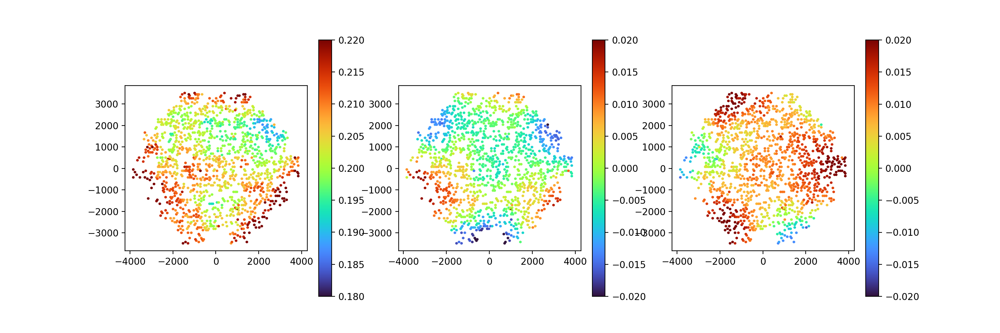

In [51]:
usecut = ((flux>5.e5) & (~frsnrcut))
f,ax = plt.subplots(1,3,figsize=(15,5))
im = ax[0].hexbin(upos[usecut],vpos[usecut],e0[usecut],gridsize=100,cmap=cm.turbo,vmin=0.18,vmax=0.22)
ax[0].set_aspect('equal')
plt.colorbar(im,ax=ax[0])
im = ax[1].hexbin(upos[usecut],vpos[usecut],e1[usecut],gridsize=100,cmap=cm.turbo,vmin=-0.02,vmax=0.02)
ax[1].set_aspect('equal')
plt.colorbar(im,ax=ax[1])
im = ax[2].hexbin(upos[usecut],vpos[usecut],e2[usecut],gridsize=100,cmap=cm.turbo,vmin=-0.02,vmax=0.02)
ax[2].set_aspect('equal')
plt.colorbar(im,ax=ax[2])

In [52]:
## Try a flux_extra cut using the SNR of the flux in that region...

In [53]:
# weighted flux doesn't make sense...
# try using w*I*I for the flux, and it isn't the weighted mean - but a weighted sum! don't divide!
# this code isn't working 
def calcRingB(stars,stamp_size=19,cutoff_nuisance_level=7.5):
    
    half = (stamp_size-1)/2
    ixs = half - np.arange(stamp_size)    
    ix,iy = np.meshgrid(ixs, ixs)
    r = np.sqrt(ix*ix+iy*iy)
    radius = (stamp_size-1.0)*(5.0/12.0)
    ring = (r>radius)

    flux_extras = []
    fluxes = []
    varfluxes = []
    varflux_extras = []
    for star_i, star in enumerate(stars):
        if star.image.array.shape[0] != stamp_size or star.image.array.shape[1] != stamp_size:
            fluxes.append(np.nan)
            flux_extras.append(np.nan)
        else: 
            imout = star.image.array[ring]
            imin = star.image.array[~ring]
            wout = star.weight.array[ring]
            win = star.weight.array[~ring]
            flux =  np.sum(win*imin)/np.sum(win)
            fluxes.append(flux)
            varfluxes.append(1.0/np.sum(win))
            flux_extra = np.sum(wout*imout)/np.sum(wout)
            flux_extras.append(flux_extra)
            varflux_extras.append(1.0/np.sum(wout))

    flux_extras = np.array(flux_extras)
    fluxes = np.array(fluxes)
    varfluxes = np.array(varfluxes)
    varflux_extras = np.array(varflux_extras)
    
    # Model leakage as simply: flux_extras = alpha * fluxes
    cut = (fluxes>1.e3)
    alpha = np.nanmedian(flux_extras[cut]/fluxes[cut])
    
    # Subtract off the leakage contribution: other = flux_extras - alpha*fluxes
    other = flux_extras - alpha*fluxes
    
    # calculate variance of other
    # varother = varflux_extras + alpha^2 * varfluxes
    varother = varflux_extras + alpha*alpha*varfluxes
    
    # SNR
    snr_other = other/np.sqrt(varother)
    
    return fluxes,flux_extras,other,varfluxes,varflux_extras,varother,snr_other,alpha

In [54]:
fluxes,flux_extras,other,varfluxes,varflux_extra,varother,snr_other,alpha  = calcRingB(stars)
print("ratio of extra/flux = ",alpha)

ratio of extra/flux =  0.07335900408828794


<IPython.core.display.Javascript object>


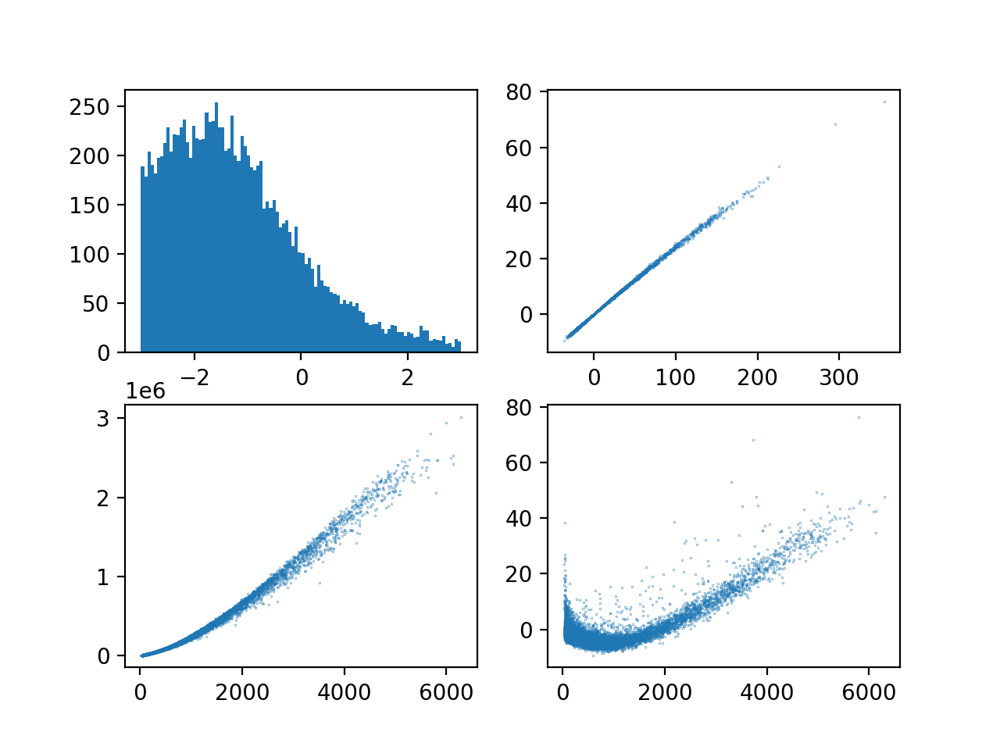

In [55]:
f,ax = plt.subplots(2,2)
axf = ax.flatten()
axf[0].hist(snr_other,bins=100,range=(-3.,3.))
axf[1].scatter(other,snr_other,marker='.',s=0.1)
axf[2].scatter(fluxes,flux,marker='.',s=0.1)
axf[3].scatter(fluxes,snr_other,marker='.',s=0.1)

# Search for Stars mag<15 

In [56]:
from astropy.wcs import WCS
hdu = fits.open("/nfs/slac/kipac/fs1/g/des/aresh/large_testbed_y1/228724/psf_im_228724_01.fits.fz")
w = WCS(hdu[1].header)
x, y = w.world_to_pixel(pointing_c)
print(x, y)  

13416.69119405398 6284.23263823181


In [57]:
# find bright Gaia stars
rpmag = resultG['phot_rp_mean_mag']
for i in range(len(rpmag)):
    if rpmag[i]<15.:
        ra_gstar = Angle(resultG['ra'][i],u.deg)
        dec_gstar = Angle(resultG['dec'][i],u.deg)
        gpoint = SkyCoord(ra_gstar,dec_gstar, frame='icrs')
        x,y = w.world_to_pixel(gpoint)
        if x>0 and x<2048 and y>0 and y<4096:
            print(rpmag[i],x,y)

14.874752 1912.5091785429158 3181.899950776199
13.436602 1746.5094417884138 3196.2104458060567
13.898717 1746.1213076986587 2655.381375574351
14.227522 1348.5384442616796 3832.4750263792816
12.567104 1813.613320864275 2117.5924459095872
10.269192 1203.7255732358954 2725.0665581046737
12.614034 1043.8370539868229 2770.6311642782325
14.969458 756.2352751610015 3979.501003248014
12.829968 613.5357658608846 988.1432483016858
13.9226675 432.00254251445403 1434.4281315201854
10.59549 8.310997120408501 1585.5792300201178
12.813938 167.56559541643037 871.1351045817613
11.6823015 418.6625210737184 171.13014046847542


<IPython.core.display.Javascript object>


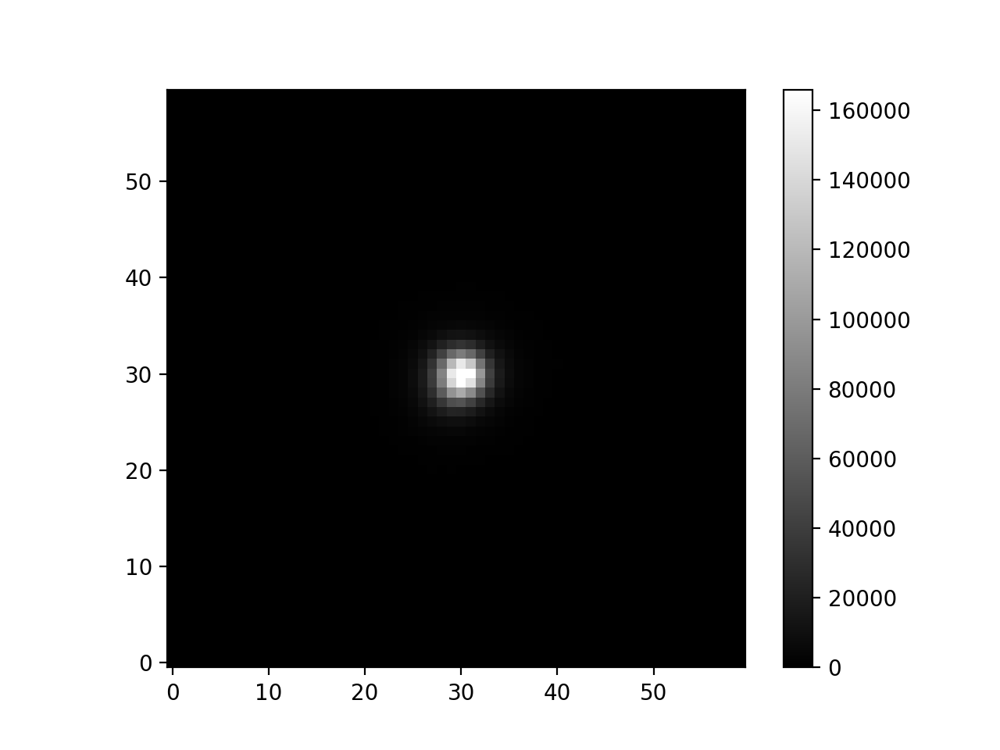

Max Pixel value =  165897.64
header SATURATE =  166261.713086415


In [58]:
f,ax = plt.subplots(1,1)

# arguments to image data array are [iY,iX]  !
half = 30
im, norm = imshow_norm(hdu[1].data[3182-half:3182+half,1912-half:1912+half], ax, origin='lower', interpolation='None',cmap='gray',
                       interval=MinMaxInterval(),
                       stretch=LinearStretch())
f.colorbar(im)

pmax = np.max(hdu[1].data[3182-half:3182+half,1912-half:1912+half])
print('Max Pixel value = ',pmax)
print('header SATURATE = ',hdu[1].header['SATURATE'])

Brightest stars are removed by demanding that no pixel in the postage stamp is masked - saturation mask is catching these brightest stars

<IPython.core.display.Javascript object>


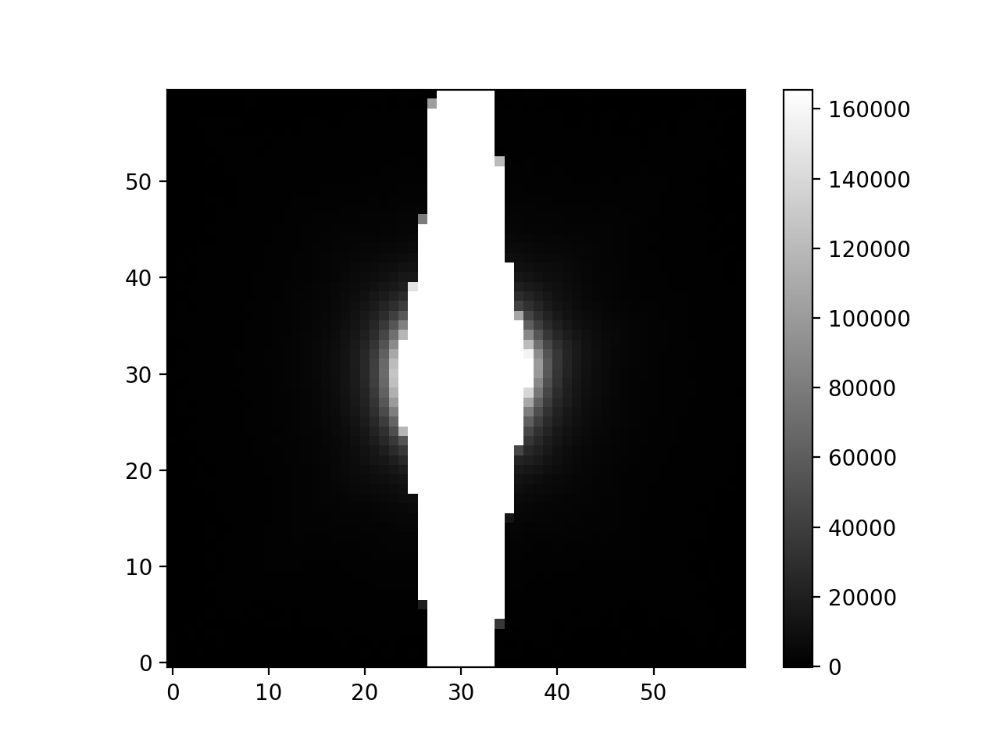

Max Pixel value =  165396.62
header SATURATE =  166261.713086415


In [60]:
f,ax = plt.subplots(1,1)

# arguments to image data array are [iY,iX]  !
half = 30
im, norm = imshow_norm(hdu[1].data[2725-half:2725+half,1203-half:1203+half], ax, origin='lower', interpolation='None',cmap='gray',
                       interval=MinMaxInterval(),
                       stretch=LinearStretch())
f.colorbar(im)

pmax = np.max(hdu[1].data[2725-half:2725+half,1203-half:1203+half])
print('Max Pixel value = ',pmax)
print('header SATURATE = ',hdu[1].header['SATURATE'])

<IPython.core.display.Javascript object>


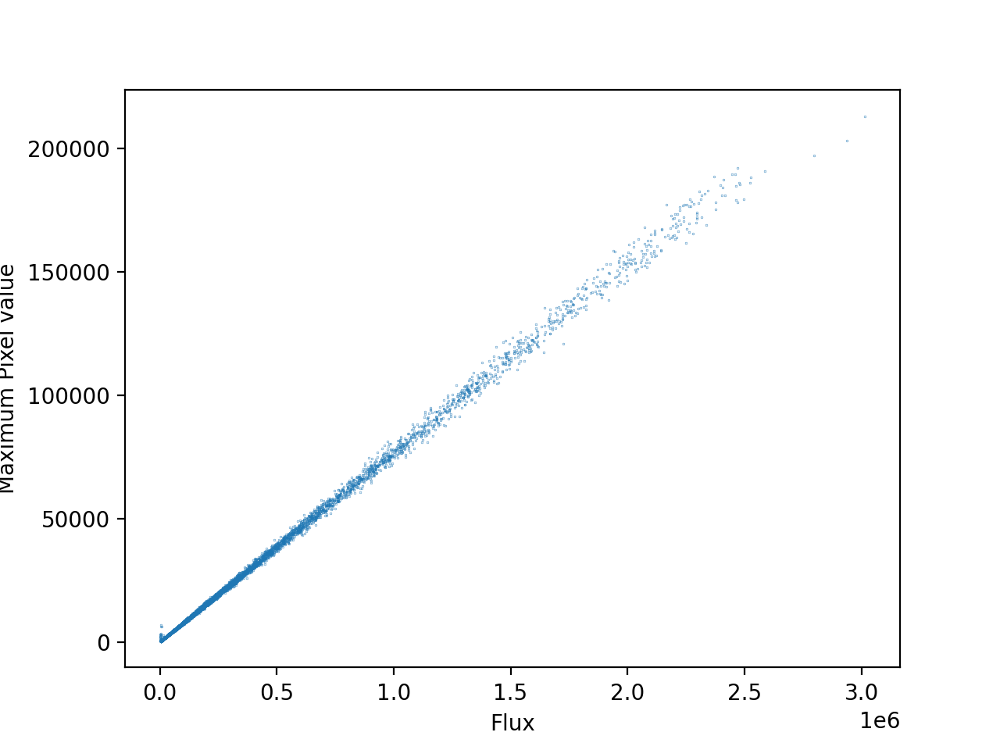

Text(0, 0.5, 'Maximum Pixel value')

In [63]:
f,ax = plt.subplots(1,1)
h = ax.scatter(flux,mmax,marker='.',s=0.1)
ax.set_xlabel('Flux')
ax.set_ylabel('Maximum Pixel value')

A reasonable cut to avoid Brighter-Fatter is to cut at the typical Flux value corresponding to a maximum pixel value of 100ke- which is about 60% of full-well. Don't want to cut on maximum pixel itself - this is a bit shape depedent.

<IPython.core.display.Javascript object>


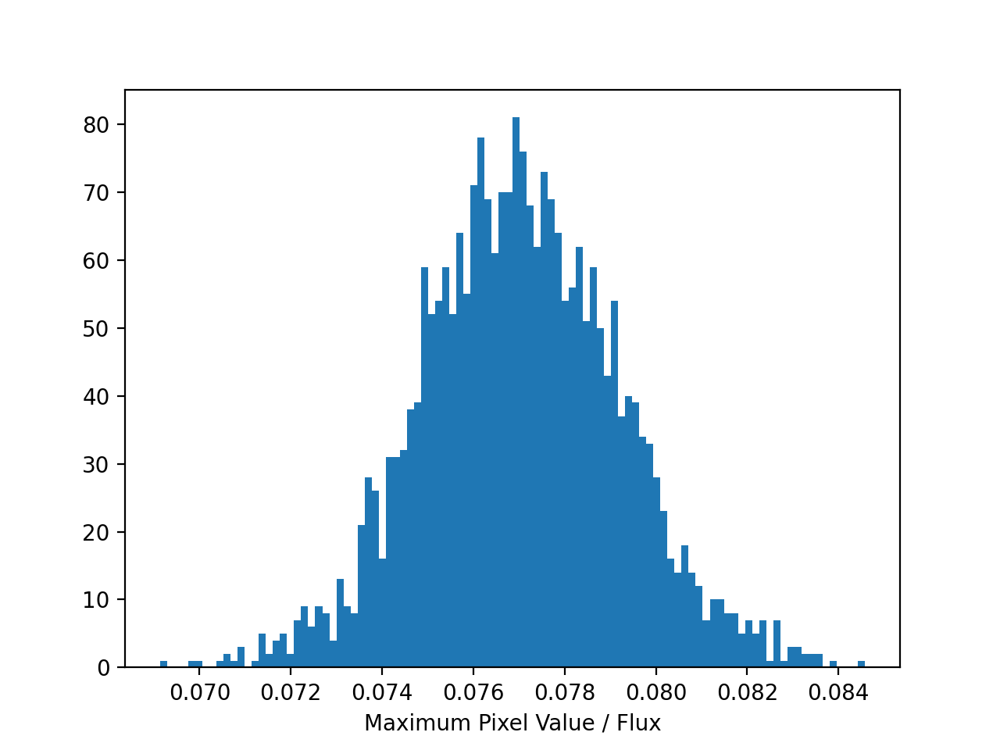

Median Ratio Maximum pixel / Flux = 0.0770
Flux cut 1.3e+06 for Maximum Pixel value of 1e+05
Magnitude cut 15.7


In [71]:
f,ax = plt.subplots(1,1)
h = ax.hist(mmax[(flux>3.e5)]/flux[(flux>3.e5)],bins=100)
ax.set_xlabel('Maximum Pixel Value / Flux')
maxtoflux_ratio = np.median(mmax[(flux>3.e5)]/flux[(flux>3.e5)])
print("Median Ratio Maximum pixel / Flux = %.4f" % (maxtoflux_ratio))
maxpixellevel = 1.e5
fluxcut = maxpixellevel / maxtoflux_ratio 
print("Flux cut %.3g for Maximum Pixel value of %.3g" % (fluxcut,maxpixellevel))
print("Magnitude cut %.1f" % (-2.5*np.log10(fluxcut)+31.) )

In [ ]:
# now find the flux corresponding to this 

# Get Reference Wavefront values at these Star locations

In [61]:
from piff.optatmo_psf import lower_order_reference_WF